In [1]:
import numpy as np
import matplotlib.pyplot as plt
import sjoert.stellar
import pandas as pd
import os
from tqdm import tqdm
from astropy import coordinates as coord
from scipy.optimize import curve_fit
import forced_phot as fp #import flux_jy, chi2, gaussian, chi2_peak_finder
from scipy.constants import h,c,k
import json
from numpyencoder import NumpyEncoder #by Hunter M. Allen (https://pypi.org/project/numpyencoder/)

sjoertpath = r'C:\Users\timvd\Documents\Uni 2023-2024\First Research Project\Data\Sjoert_Flares'

The below shouldn't be in the class but should be the loop in which the class is called.

In [2]:
test_ztf = 'ZTF18aavummp'
cwd = os.getcwd()
dir = cwd
while not dir.endswith('First Research Project\\Data'):
    cwd = os.path.split(cwd)[0]
    dir = cwd + "\\Data"
banlist = set(['DOWNLOADED','EMPTY','dump'])
iterlist = sorted(set(os.listdir(dir)) - banlist)

for folder in iterlist:
    folder_dir = os.path.join(dir,folder)
    for ztf_name in os.listdir(folder_dir):
        # call the class
        pass


In [3]:
names = ['log10(Fp)', 't_0', 'log10(sigma_rise)', 'log10(tau_dec)', 'F_0', 'log10(T)']
params_names = ['F_p', 't_0', 'sigma_rise','tau_dec', 'F_0', 'T', 'nu_0']
log_names = ['log10_'+params_names[i] for i,name in enumerate(names) if 'log10' in name]


In [4]:
class ZTF_forced_phot:
    def __init__(self,ztf_dir,ztf_name=None,onefilt_crosscor=True): 
        """Class: ZTF_forced_phot. Given a directory and optionally a name (if the name is not the end of the directory), perform forced photometry
        on the object. Both a plot of the raw and clean data together as well as a plot with fits to the data may be generated. After fitting the 
        subsequent parameters may be saved to a json file as well. Saving happens in the specified directory. The __init__() function loads in the 
        data and does some necessary preprocessing.
        The class runs on pandas to create dataframes, both for oversight in the code and ease in calling columns. This is of course not necessary
        and the code may be relatively easy rewritten to contain only NumPy arrays.

        Args:
            ztf_dir (str): Path to the directory where the clean data, raw data and log file of the ZTF data is stored.
            ztf_name (str, optional): Name of the ZTF we are investigating here. Preferably, the data directory of each object is named after
            the object itself and thus the ZTF identifier may be taken from the ztf_dir argument. If this is not the case, use this argument.
            Defaults to None.
        """
        if ztf_name == None:
            ztf_name = os.path.split(ztf_dir)[-1]


        #gather the log and check if there even is any viable g and r data.
        #if there is not, turn on a flag to prevent errors later on and write the 
        #case to a txt file in the parent directory.
        with open(os.path.join(ztf_dir,f"{ztf_name}_clean_log.json")) as f:
            logfile = json.load(f)

        self.no_gr_flag = False
        if logfile['ZTF_g']['no_viable_data'] or logfile['ZTF_r']['no_viable_data']:
            parent_dir = os.path.split(ztf_dir)[0]
            with open(os.path.join(parent_dir,'no_viable_g_or_r.txt'),'a+') as no_gr_file:
                no_gr_file.seek(0)
                lines = no_gr_file.readlines()
                if ztf_name+'\n' not in lines:
                    no_gr_file.write(ztf_name+'\n')
            
            self.no_gr_flag = True
            print(f'No viable g or r data in {ztf_name}. Skipping this instance.')
            return 


        clean_data = pd.read_csv(os.path.join(ztf_dir,f"{ztf_name}_clean_data.txt"),
                                 sep='\t',comment='#',
                                 names=['time','flux','flux_unc','zeropoint','filter'])
        clean_data.sort_values('time',inplace=True) #sort the data by time for plotting reasons later on
        no_i_mask = clean_data['filter'] != 'ZTF_i' #create the ZTf_i mask to filter out ZTF-i-band data.
        flux,err = fp.flux_jy(clean_data) #convert the flux and its errors to uJY using the zeropoint zpdiff
        err = np.clip(err,0.01*flux,np.inf) # clip the errors to be at least 1% of the flux
        clean_data['flux'] = flux.values #overwrite with new data
        clean_data['flux_unc'] = err.values 

        #create numpy arrays for ease and efficiency
        flux, err, time = clean_data[['flux','flux_unc','time']].T.to_numpy(dtype=np.float64)

        time_zeropoint = 2458484.5 #JD of 01-01-2019 @ 00:00:00.000
        #transform time column
        time_mjd = clean_data['time'] - time_zeropoint
        clean_data['time'] = time_mjd.values 

        columns = ['sindex', 'field', 'ccdid', 'qid', 'filter', 'pid', 'infobitssci', 'sciinpseeing', 'scibckgnd', 'scisigpix', 'zpmaginpsci', 'zpmaginpsciunc', 'zpmaginpscirms', 'clrcoeff', 'clrcoeffunc', 'ncalmatches', 'exptime', 'adpctdif1', 'adpctdif2', 'diffmaglim', 'zpdiff', 'programid', 'jd', 'rfid', 'forcediffimflux', 'forcediffimfluxunc', 'forcediffimsnr', 'forcediffimchisq', 'forcediffimfluxap', 'forcediffimfluxuncap', 'forcediffimsnrap', 'aperturecorr', 'dnearestrefsrc', 'nearestrefmag', 'nearestrefmagunc', 'nearestrefchi', 'nearestrefsharp', 'refjdstart', 'refjdend', 'procstatus']
        dtypes = [(columns[x],float) for x in range(len(columns))]
        dtypes[4] = ('filter',r'U8')
        for file in os.listdir(ztf_dir):
            if 'batchfp' in file:
                batchrq_string = file
        unclean_data = pd.DataFrame(np.genfromtxt(os.path.join(ztf_dir,batchrq_string),skip_header=53,dtype=dtypes))
        unclean_data = unclean_data[unclean_data['forcediffimfluxunc'] > 0] #these need to be removed or plotting doesn't work, usually not a lot of datapoints.


        #Source: http://svo2.cab.inta-csic.es/theory/fps/index.php?mode=browse&gname=Palomar&gname2=ZTF&asttype=
        g_center = c/ (4746.48 * 1e-10)
        r_center = c / (6366.38 * 1e-10)
        i_center = c / (7867.41 * 1e-10)

        self.clean_filtermasks = [(clean_data['filter'] == 'ZTF_g'), (clean_data['filter'] == 'ZTF_r'), (clean_data['filter'] == 'ZTF_i')]

        # chi2_results, peak_ind, t_0_guess, peak_guess = fp.chi2_peak_finder(flux,err,clean_data['time'],time_zeropoint)
        #cross correlation with a simple Gaussian to get a guess for the peak.

        if onefilt_crosscor:
            peak_ind_g,t_0_guess_g,peak_guess_g = fp.cross_correlation(flux[self.clean_filtermasks[0]],
                                                                       clean_data['time'].values[self.clean_filtermasks[0]],
                                                                       time_zeropoint,full_output=False,interp_data=True)
            peak_ind_r,t_0_guess_r,peak_guess_r  = fp.cross_correlation(flux[self.clean_filtermasks[1]],
                                                                        clean_data['time'].values[self.clean_filtermasks[1]],
                                                                        time_zeropoint,full_output=False,interp_data=True)

            print('Green:',peak_ind_g,t_0_guess_g,peak_guess_g)
            print("Red:",peak_ind_r,t_0_guess_r,peak_guess_r)

        peak_ind,t_0_guess,peak_guess = fp.cross_correlation(flux,clean_data['time'].values,time_zeropoint,full_output=False,interp_data=True)
        print('Combined',peak_ind,t_0_guess,peak_guess)
        # peak_ind,t_0_guess,peak_guess = fp.cross_correlation(flux[self.clean_filtermasks[0]],clean_data['time'].values[self.clean_filtermasks[0]],time_zeropoint,full_output=False,interp_data=True)

        time_mask_pure = (clean_data['time'] > (t_0_guess - 365)) & (clean_data['time'] < (t_0_guess+365*2)) #these are the times we will be fitting on
        time_mask = time_mask_pure * no_i_mask # also filter out ZTF_i measurements

        #values for fitting
        flux_fit,err_fit,time_fit,filters_fit = flux[time_mask],err[time_mask],clean_data['time'][time_mask].to_numpy(),clean_data['filter'][time_mask].to_numpy()

        #frequency array and "central" frequency for blackbody ratio correction
        nu_1 = [g_center if f == 'ZTF_g' else r_center for f in filters_fit]
        nu_1 = np.array(nu_1).astype(np.float64)
        nu_0 = np.average([g_center,r_center],weights=[np.sum(filters_fit=='ZTF_g'),np.sum(filters_fit=='ZTF_r')])

        #Initial guesses and boundings for fitting in order: Fp, peak_pos, sigma, tau_dec, F0, T
        #There are seperate initial guesses for g and r only fitting, namely in the baseline
        guesses = [np.log10(np.max(flux_fit)),t_0_guess,1,2.5,0,4]
        guesses_g = [np.log10(np.max(flux_fit)),t_0_guess,1,2.5,np.median(flux[np.invert(time_mask) & self.clean_filtermasks[0]]),4]
        guesses_r = [np.log10(np.max(flux_fit)),t_0_guess,1,2.5,np.median(flux[np.invert(time_mask) & self.clean_filtermasks[1]]),4]
        
        #365 used to be 100 keep that in mind
        boundings = ([1,t_0_guess-365,0,0,np.min(flux[no_i_mask]),3],[np.log10(np.max(flux_fit*2)),t_0_guess+365,4,4,.5*np.max(flux_fit),5]) 
        boundings_g = ([1,t_0_guess-10,0,0,np.percentile(flux[np.invert(time_mask)&self.clean_filtermasks[0]],5),3], #lower bounds
                       [np.log10(np.max(flux_fit*2)),t_0_guess+10,4,4,np.percentile(flux[np.invert(time_mask)&self.clean_filtermasks[0]],95),5]) #upper boundings
        boundings_r = ([1,t_0_guess-10,0,0,np.percentile(flux[np.invert(time_mask)&self.clean_filtermasks[1]],5),3], #lower bounds
                       [np.log10(np.max(flux_fit*2)),t_0_guess+10,4,4,np.percentile(flux[np.invert(time_mask)&self.clean_filtermasks[1]],95),5]) #upper boundings

        #initializing all the variables that need to be used later on with self.
        self.ztf_name = ztf_name
        self.ztf_dir = ztf_dir

        self.no_i_mask = no_i_mask
        self.time_zeropoint = time_zeropoint
        self.time_mask = time_mask

        self.clean_data = clean_data
        self.flux, self.err, self.time = self.clean_data[['flux','flux_unc','time']].T.to_numpy(dtype=np.float64)
        self.flux_fit,self.err_fit,self.time_fit,self.filters_fit = flux_fit,err_fit,time_fit,filters_fit

        if sum(self.clean_filtermasks[-1]) == 0:
            self.no_i_data = True
        else:
            self.no_i_data = False

        self.logfile = logfile
        self.unclean_data = unclean_data
        self.g_center = g_center
        self.r_center = r_center
        self.i_center = i_center
        self.nu_0, self.nu_1 = nu_0, nu_1
        self.guesses, self.boundings= guesses, boundings
        self.guesses_g, self.guesses_r = guesses_g, guesses_r
        self.boundings_g, self.boundings_r = boundings_g, boundings_r
        self.peak_ind, self.t_0_guess, self.peak_guess = peak_ind, t_0_guess, peak_guess
        self.time_mask_pure = time_mask_pure


    def plot_clean_unclean_data(self,clean_ylim=True):
        if self.no_gr_flag:
            return

        clean_flux, clean_err, clean_time = self.flux,self.err,self.time
        raw_flux, raw_err, raw_time = self.unclean_data[['forcediffimflux','forcediffimfluxunc','jd']].T.to_numpy(dtype=np.float64)
        raw_flux = sjoert.stellar.mag2flux(self.unclean_data['zpdiff']) * 1e6 * raw_flux
        raw_err = sjoert.stellar.mag2flux(self.unclean_data['zpdiff']) * 1e6 * raw_err
        raw_time -= self.time_zeropoint

        raw_filtersmasks = [(self.unclean_data['filter'] == 'ZTF_g'), (self.unclean_data['filter'] == 'ZTF_r'), (self.unclean_data['filter'] == 'ZTF_i')]
        colors = ['green','red','brown']
        names = ['ZTF g-band','ZTF r-band','ZTF i-band']
        rawlabels = ['Raw data',None,None]

        num_rows = np.sum([ 1 if np.sum(fmask) > 0 else 0 for fmask in raw_filtersmasks])
        fig,axes = plt.subplots(nrows=num_rows,sharex=True,figsize=(8,8))
        plt.suptitle(self.ztf_name,fontsize=14)
        axes[0].xaxis.set_tick_params(which='both', labelbottom=True)
        axes[1].xaxis.set_tick_params(which='both', labelbottom=True)

        lines = []
        labels = []

        for i,ax in enumerate(axes):
            ax.set_title(names[i])
            ax.errorbar(raw_time[raw_filtersmasks[i]],raw_flux[raw_filtersmasks[i]],raw_err[raw_filtersmasks[i]],fmt=',',alpha=0.5,c='gray',label=rawlabels[i],capsize=2)
            if i == 2:
                if self.no_i_data:
                    print("There is no clean ZTF i-band data.")
                else:
                    ax.errorbar(clean_time[self.clean_filtermasks[i]],clean_flux[self.clean_filtermasks[i]],clean_err[self.clean_filtermasks[i]],fmt=',',c=colors[i],label=names[i],capsize=2)
            else:
                ax.errorbar(clean_time[self.clean_filtermasks[i]],clean_flux[self.clean_filtermasks[i]],clean_err[self.clean_filtermasks[i]],fmt=',',c=colors[i],label=names[i],capsize=2)
            
            ax.set_ylabel(r'Flux [$\mu$Jy]',fontsize=12)
            Line, Label = ax.get_legend_handles_labels() 
            lines.extend(Line) 
            labels.extend(Label)
            if clean_ylim:
                if i == 2 and self.no_i_data:
                    pass
                else:
                    ax.set_ylim(1.25*np.min(clean_flux[self.clean_filtermasks[i]]),1.25*np.max(clean_flux[self.clean_filtermasks[i]]))
        
        
        plt.xlabel(f'Time [mjd] w.r.t. JD {self.time_zeropoint}',fontsize=12)
        fig.tight_layout()
        fig.legend(lines,labels,bbox_to_anchor=[1.2,0.6],fontsize=12)
        plt.show()
    
    def BB(self,nu,T):
        #Blackbody spectrum for a certain frequency given in Hz, not an array of values
        factor = 2*h*np.power(nu,3)/(c**2)
        exponent = (h*nu)/(k*T)
        return factor /(np.exp(exponent)-1)
    
    def BB_ratio(self,T,v,v_0):
        return self.BB(v,T)/self.BB(v_0,T)

    def gauss_exp(self,t,nu,nu_0,no_baseline,*p):

        Fp = 10**p[0]
        t_0 = p[1]
        sigma_rise = 10**p[2]
        tau_dec = 10**p[3]
        no_temp = False
        try:
            T = 10**p[5]
        except:
            no_temp = True
        if no_baseline:
            T = 10**p[4]
            no_temp = False
            F_0 = 0
        else:
            F_0 = p[4]

        trel = t - t_0
        gaussian = lambda t1: Fp * np.exp(-(np.square(t1-t_0)/(2*sigma_rise**2))) + F_0
        exp_decay = lambda t1: Fp * np.exp(-(t1-t_0)/tau_dec) + F_0

        function = np.piecewise(t,[trel <= 0,trel>0],[gaussian, exp_decay])
        # print((exp_decay(t[np.abs(t - t_0).argmin()]) - F_0 )/ Fp)
        if no_temp:
            return function
        else:
            return function* self.BB_ratio(T,nu,nu_0) #for plotting it should be specified at what frequency we are looking.
    
        
    #With BB temperature correction, used for comparing to ZTF_g and ZTF_r data
    def gauss_exp_fit(self,t,*p):
        return self.gauss_exp(t,self.nu_1,self.nu_0,False,*p)
    
    def gauss_exp_fit_no_baseline(self,t,*p):
        return self.gauss_exp(t,self.nu_1,self.nu_0,True,*p)

    def gauss_exp_fit_g(self,t,*p):
        return self.gauss_exp(t,self.g_center,self.nu_0,False,*p)
    
    def gauss_exp_fit_r(self,t,*p):
        return self.gauss_exp(t,self.r_center,self.nu_0,False,*p)

    def gauss_exp_fit_for_plot(self,t,v1,v0,*p):
        return self.gauss_exp(t,v1,v0,True,*p)
    
    def gauss_exp_baseline_peak(self,t,t_0,sigma_rise,tau_dec,T,v0,v1,*p):
        #only baseline and peak are fittable, used for i band
        #v0 is the same as before, v1 is the i band central frequency
        Fp = 10**p[0]
        F_0 = p[1]

        trel = t - t_0
        gaussian = lambda t: Fp * np.exp(-(np.square(t-t_0)/(2*sigma_rise**2))) + F_0
        exp_decay = lambda t: Fp * np.exp(-(t-t_0)/tau_dec) + F_0

        function = np.piecewise(t,[trel <= 0,trel>0],[gaussian, exp_decay])
        return function #* self.BB_ratio(T,v1,v0)


    def fit(self,plot=True,fit_i=True,savepath=None):
        #If this is an instance with no viable g or r data, return immediately to prevent errors.
        if self.no_gr_flag:
            return

        # First fit g and r seperately to find the baseline correction.
        popt_g, pcov_g = curve_fit(self.gauss_exp_fit_g,self.time_fit[self.clean_filtermasks[0][self.time_mask]],
                                   self.flux_fit[self.clean_filtermasks[0][self.time_mask]],
                                    p0=self.guesses_g[:-1],bounds=[b[:-1] for b in self.boundings_g],
                                    sigma=self.err_fit[self.clean_filtermasks[0][self.time_mask]],
                                    full_output=False,
                                    absolute_sigma=True,
                                    maxfev=5000) 

        popt_r, pcov_r = curve_fit(self.gauss_exp_fit_r,self.time_fit[self.clean_filtermasks[1][self.time_mask]],
                                self.flux_fit[self.clean_filtermasks[1][self.time_mask]],
                                p0=self.guesses_r[:-1],bounds=[b[:-1] for b in self.boundings_r],
                                sigma=self.err_fit[self.clean_filtermasks[1][self.time_mask]],
                                full_output=False,
                                absolute_sigma=True,
                                maxfev=5000)
        
        #Get the filter dependent baseline and its error from the fit.
        F0_g, F0_g_err = popt_g[-1], np.sqrt(np.diag(pcov_g)[-1])
        F0_r, F0_r_err = popt_r[-1], np.sqrt(np.diag(pcov_r)[-1])

        #Create an array with varying values, either the g-band baseline or the r-band baseline, used for fitting both filters together
        #much in the same way as we did for nu_1
        baseline = [F0_g if self.filters_fit[i] == 'ZTF_g' else F0_r for i in range(len(self.filters_fit))]
        baseline_err = [F0_g_err if self.filters_fit[i] == 'ZTF_g' else F0_r_err for i in range(len(self.filters_fit))]


        #fitting g and r together to get the other parameter values. The data is fitted on baseline transposed data 
        #(with subsequent error propagation) but this is not the shown data in the plot.
        popt,pcov = curve_fit(self.gauss_exp_fit_no_baseline,self.time_fit,self.flux_fit - baseline,
                                            p0=self.guesses[:-2]+[self.guesses[-1]],bounds=[b[:-2]+[b[-1]] for b in self.boundings],
                                            sigma=np.sqrt(np.square(self.err_fit) + np.square(baseline_err)),
                                            full_output=False,
                                            absolute_sigma=True,
                                            maxfev=5000)

        #Get the error estimates from the covariance matrix
        perr = np.sqrt(np.diag(pcov))

        #No i-data? Then don't try to fit a baseline and peak to i 
        if np.sum(np.invert(self.no_i_mask)) == 0:
            fit_i = False
        if fit_i:
            #Fitting on i-band data. We fit here only a baseline and a peak keeping the other found parameters equal.
            i_func_to_fit = lambda t,*p: self.gauss_exp_baseline_peak(t,popt[1],popt[2],popt[3],popt[4],self.nu_0,self.i_center,*p)
            only_i_mask = np.invert(self.no_i_mask)
            i_time = self.clean_data['time'][only_i_mask].values
            i_flux,i_flux_err = self.clean_data['flux'][only_i_mask].values, self.clean_data['flux_unc'][only_i_mask].values

        #Initial guesses and boundings for fitting in order: Fp, peak_pos, sigma, tau_dec, F0, T
        #check if there is even any data within the time-frame in which we fit the data
        #if there isn't we can just use the i-data as is since it always exists outside our time-frame

            if len(i_flux[np.invert(self.time_mask_pure)[only_i_mask]]) ==0:
                i_guesses = [np.log10(np.max(i_flux)),np.median(i_flux)]
                i_bounds = ([np.log10(0.5*np.max(i_flux)),np.percentile(i_flux,5)],
                        [np.log10(np.max(i_flux*2)),np.percentile(i_flux,95)])
            #otherwise, we must do some calculations to make sure we do our estimations on the data outside the timeframe
            else:
                f_guess_bounds = i_flux[np.invert(self.time_mask_pure)[only_i_mask]] #Get only the i data that exists outside our time-frame
                if len(f_guess_bounds) <= 2:
                    f_guess_bounds = i_flux

                i_guesses = [np.log10(np.max(i_flux)),np.median(f_guess_bounds)]
                i_bounds = ([np.log10(0.5*np.max(i_flux)),np.percentile(f_guess_bounds,5)],
                        [np.log10(np.max(i_flux*2)),np.percentile(f_guess_bounds,95)])

            #Fit i
            popt_i,pcov_i = curve_fit(i_func_to_fit,i_time,i_flux,
                                            p0=i_guesses,
                                            bounds=i_bounds,
                                            sigma=i_flux_err,
                                            full_output=False,
                                            absolute_sigma=True,
                                            maxfev=5000)
            

        #calculate the chi2/dof for the g and r data combined
        dof = len(self.filters_fit) - (len(popt) + 2) #number of points in g and r - the amount of parameters (popt and the 2 baselines)
        chi2val = fp.chi2(self.flux_fit - baseline,np.sqrt(np.square(self.err_fit) + np.square(baseline_err)),
                       self.gauss_exp_fit_no_baseline(self.time_fit,*popt))
        
        print(f"{chi2val=} and {dof=}")
        print(f'Found chi2/dof = {chi2val/dof:.6f}')


        if plot:
            #array to smoothen the line in the figure
            moretimes = np.linspace(min(self.time_fit),max(self.time_fit),1000)

            centers = [self.g_center,self.r_center,self.i_center]
            
            baseline_corr = [F0_g,F0_r,0]

            #Get the fits for the three filters, undoing the transposition of the baseline correction from before.
            fits_plot = [self.gauss_exp_fit_for_plot(moretimes,c,self.nu_0,*popt) + baseline_corr[i] for i,c in enumerate(centers)]
            
            #If we fitted i, the third entry in fits_plot is now inaccurate since we have a better baseline
            #and peak, so re-do this.
            if fit_i:
                #order: Fp, peak_pos, sigma, tau_dec, F0, T
                new_popt = [popt_i[0],*popt[1:4],popt_i[1]]#,popt[-1]]
                fits_plot[2] = self.gauss_exp(moretimes,self.i_center,self.nu_0,False,*new_popt)

            #Create a string for presenting the parameters in the figure
            paramstr = ''
            newnames = [r'log$_{10}$(F$_\mathrm{p}$)',r't$_0$',r'log$_{10}(\sigma_\mathrm{rise}$)',r'log$_{10}(\tau_\mathrm{dec}$)',r'log$_{10}$(T)']
            for i,n in enumerate(newnames):
                paramstr += f'{n} = {popt[i]:.2f} ± {perr[i]:.3f}'
                paramstr += '\n'

            colors = ['green','red','brown']
            labels_ebar = ['ZTF: g-band','ZTF: r-band','ZTF: i-band']
            lines = []
            labels = []

            fig,axes = plt.subplots(nrows=3,sharex=True,figsize=(8,8))
            #so that ticks are visible on each x-axis but (because of sharex = True) no label except for the bottom axis.
            axes[0].xaxis.set_tick_params(which='both', labelbottom=True)
            axes[1].xaxis.set_tick_params(which='both', labelbottom=True)
            #plot the data and fits
            for i,ax in enumerate(axes):
                ax.errorbar(self.clean_data['time'][self.clean_filtermasks[i]],self.clean_data['flux'][self.clean_filtermasks[i]],
                            self.clean_data['flux_unc'][self.clean_filtermasks[i]],
                            fmt='.',c=colors[i],label=labels_ebar[i],capsize=2)
                if i == 0:
                    ax.plot(moretimes,fits_plot[i],c='black',zorder=10,label='Fit')
                else:
                    ax.plot(moretimes,fits_plot[i],c='black',zorder=10)

                if i < 2:#used to be <3. <2 excludes i but < 3 is always true here
                    if i == 0:
                        ax.scatter(self.t_0_guess,self.peak_guess,s=50,marker='x',c='blue',zorder=10,label='Starting point') 
                    else:
                        ax.scatter(self.t_0_guess,self.peak_guess,s=50,marker='x',c='blue',zorder=10) 

                ax.set_ylabel(r"Flux ($\mu$Jy)",fontsize=12)

                #For the legend
                Line, Label = ax.get_legend_handles_labels() 
                lines.extend(Line) 
                labels.extend(Label)
                
            #Add in the first baseline and add it to the legend lists, since every baseline looks the same
            axes[0].hlines(F0_g,min(self.time),max(self.time),linestyles='dashed',colors='black',label='Baseline')#,label=r'F$_{0,g} = $' + f'{F0_g:.3f} ± {F0_g_err:.3f}')
            lin,lab = axes[0].get_legend_handles_labels()
            idx = np.where(np.array(lab) == 'Baseline')[0][0]
            lines.append(lin[idx])
            labels.append(lab[idx])

            axes[1].hlines(F0_r,min(self.time),max(self.time),linestyles='dashed',colors='black')#,label=r'F$_{0,r} = $' + f'{F0_r:.3f} ± {F0_r_err:.3f}')
            if fit_i:
                axes[2].hlines(popt_i[1],min(self.time),max(self.time),linestyles='dashed',color='black')
        
            #Final parameters in the text
            paramstr += r'F$_{0,g} = $' + f'{F0_g:.2f} ± {F0_g_err:.3f}\n'
            paramstr += r'F$_{0,r} = $' + f'{F0_r:.2f} ± {F0_r_err:.3f}\n'
            paramstr += r'$\chi ^2_{\nu}$ = ' + f'{chi2val/dof:.3f}'


            axes[-1].set_xlabel(f"Time (mjd - 2458484.5)",fontsize=12)

            plt.text(0.835,0.125,paramstr,fontsize=10,backgroundcolor='lightgray',zorder=-1,transform=plt.gcf().transFigure)

            plt.suptitle(self.ztf_name,fontsize=14)
            fig.legend(lines,labels,bbox_to_anchor=[1.055,0.6],fontsize=12)
            fig.tight_layout()
            if savepath is None:
                plt.show()
            else:
                plt.savefig(os.path.join(savepath,self.ztf_name+'_fit.png'),dpi=100,bbox_inches='tight')
                plt.close()
        


        #So that parameters may be saved in the save_params function.
        #Add the baselines to the parameters as well.
        self.popt = np.concatenate([popt,[F0_g,F0_r]])
        self.perr = np.concatenate([np.sqrt(np.diag(pcov)),[F0_g_err,F0_r_err]])
        self.popt_r,self.perr_r = popt_r,np.sqrt(np.diag(pcov_r))
        self.popt_g,self.perr_g = popt_g, np.sqrt(np.diag(pcov_g))
        self.chi_nu = chi2val/dof
        if plot:
            self.fits_plot = fits_plot


    def save_params(self,savepath=None,save=True):
        if self.no_gr_flag:
            return
        
        names = ['log10(Fp)', 't_0', 'log10(sigma_rise)', 'log10(tau_dec)', 'log10(T)','F_0g','F_0r']
        params_names = ['F_p', 't_0', 'sigma_rise','tau_dec', 'T','F_0g','F_0r','nu_0']
        log_names = ['log10_'+params_names[i] for i,name in enumerate(names) if 'log10' in name]
        units = ['uJy','mjd','days','days','K','uJy','uJy','Hz']
        # filter_order = ['ZTF_g','ZTF_r']


        params = [10**p if 'log10' in names[i] else p for i,p in enumerate(self.popt)]
        param_errs = [np.log(10)*err*params[i] if 'log10' in names[i] else err for i,err in enumerate(self.perr)]

        log_params = [p for i,p in enumerate(self.popt) if 'log10' in names[i]]
        log_param_errs = [e for i,e in enumerate(self.perr) if 'log10' in names[i]]

        params.append(np.float32(self.nu_0)) #since nu_0 doesn't have an error, add it only now. 
        param_errs.append(np.float32(0))

        params.extend(log_params)
        param_errs.extend(log_param_errs)
        # print(np.shape(log_params))

        dict_keys = params_names
        dict_keys.extend(log_names)
        dict_keys.extend(['chi2_dof','units'])
        ordered_params = [np.array([np.float64(params[i]),np.float64(param_errs[i])]) for i in range(len(params))]
        ordered_params.extend([self.chi_nu,units])

        param_dict = dict(zip(dict_keys,ordered_params))
        # print(param_dict)

        #Now doing the pretty much the same again but for the filter dependent parameters
        names_g = ['log10(Fp)', 't_0', 'log10(sigma_rise)', 'log10(tau_dec)','F_0g']
        params_names_g = ['F_p', 't_0', 'sigma_rise','tau_dec','F_0g']
        log_names_g = ['log10_'+params_names_g[i] for i,name in enumerate(names_g) if 'log10' in name]

        names_r = ['log10(Fp)', 't_0', 'log10(sigma_rise)', 'log10(tau_dec)','F_0r']
        params_names_r = ['F_p', 't_0', 'sigma_rise','tau_dec','F_0r']
        log_names_r = ['log10_'+params_names_r[i] for i,name in enumerate(names_r) if 'log10' in name]

        units_filt = ['uJy','mjd','days','days','uJy']

        params_g = [10**p if 'log10' in names_g[i] else p for i,p in enumerate(self.popt_g)]
        param_errs_g = [np.log(10)*err*params_g[i] if 'log10' in names_g[i] else err for i,err in enumerate(self.perr_g)]
        log_params_g = [p for i,p in enumerate(self.popt_g) if 'log10' in names_g[i]]
        log_param_errs_g = [e for i,e in enumerate(self.perr_g) if 'log10' in names_g[i]]
        params_g.extend(log_params_g), param_errs_g.extend(log_param_errs_g)

        params_r = [10**p if 'log10' in names_r[i] else p for i,p in enumerate(self.popt_r)]
        param_errs_r = [np.log(10)*err*params_r[i] if 'log10' in names_r[i] else err for i,err in enumerate(self.perr_r)]
        log_params_r = [p for i,p in enumerate(self.popt_r) if 'log10' in names_r[i]]
        log_param_errs_r = [e for i,e in enumerate(self.perr_r) if 'log10' in names_r[i]]
        params_r.extend(log_params_r), param_errs_r.extend(log_param_errs_r)

        dict_keys_g = params_names_g
        dict_keys_g.extend(log_names_g)
        dict_keys_g.extend(['units'])
        ordered_params_g = [np.array([np.float64(params_g[i]),np.float64(param_errs_g[i])]) for i in range(len(params_g))]
        ordered_params_g.append(units_filt)
        param_dict_g = dict(zip(dict_keys_g,ordered_params_g))

        dict_keys_r = params_names_r
        dict_keys_r.extend(log_names_r)
        dict_keys_r.extend(['units'])
        ordered_params_r = [np.array([np.float64(params_r[i]),np.float64(param_errs_r[i])]) for i in range(len(params_r))]
        ordered_params_r.append(units_filt)
        param_dict_r = dict(zip(dict_keys_r,ordered_params_r))


        param_dicts = [param_dict,param_dict_g,param_dict_r]
        if save:
            if savepath == None:
                savepath = self.ztf_dir
            
            filename = self.ztf_name + '_parameters'
            all_filenames = [filename,filename+'_g',filename+'_r']
            for i,fn in enumerate(all_filenames):
                with open(os.path.join(savepath,fn),'w') as file:
                    json.dump(param_dicts[i],file,indent = 4,cls=NumpyEncoder)

        return param_dicts


        




In [5]:
# rand_inst = os.listdir(sjoertpath)[1:]
# # np.random.shuffle(rand_inst)
# for i,ztf_name in enumerate(rand_inst):
#     print(ztf_name)
#     print('Filter: peak index, t0_guess, best_flux')
#     testing = ZTF_forced_phot(os.path.join(sjoertpath,ztf_name))
#     print()
    

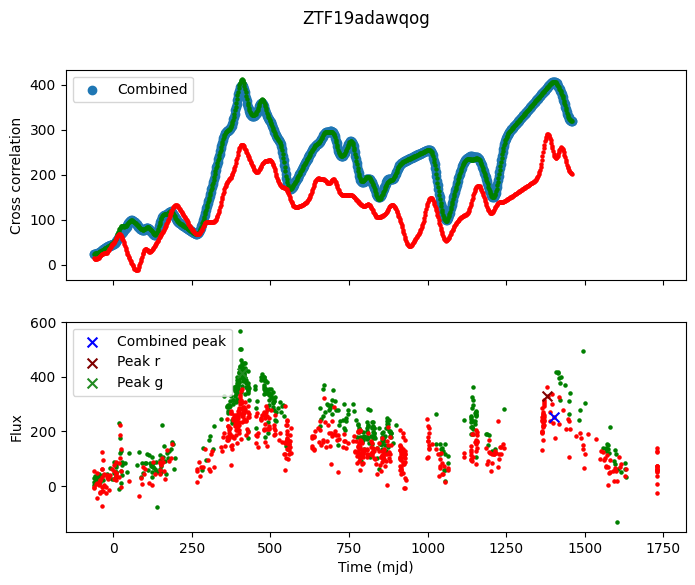

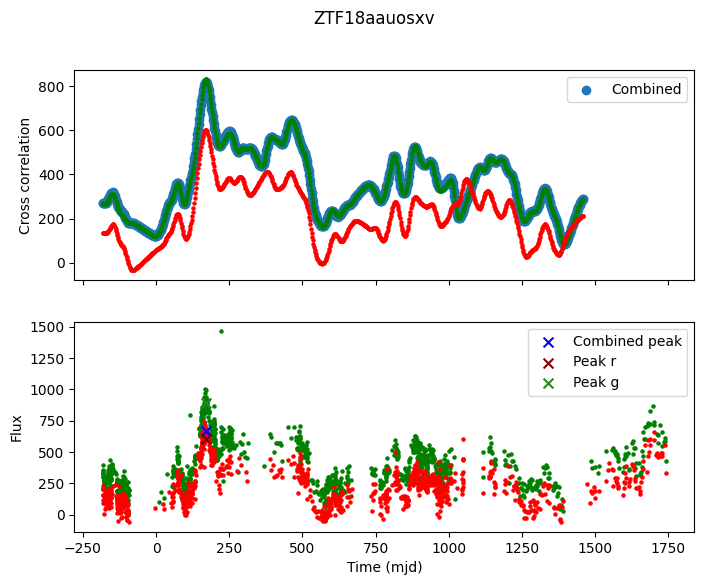

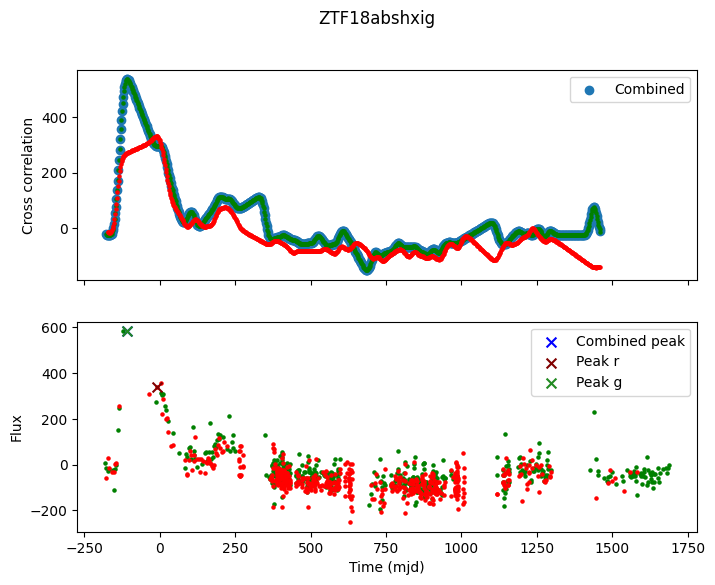

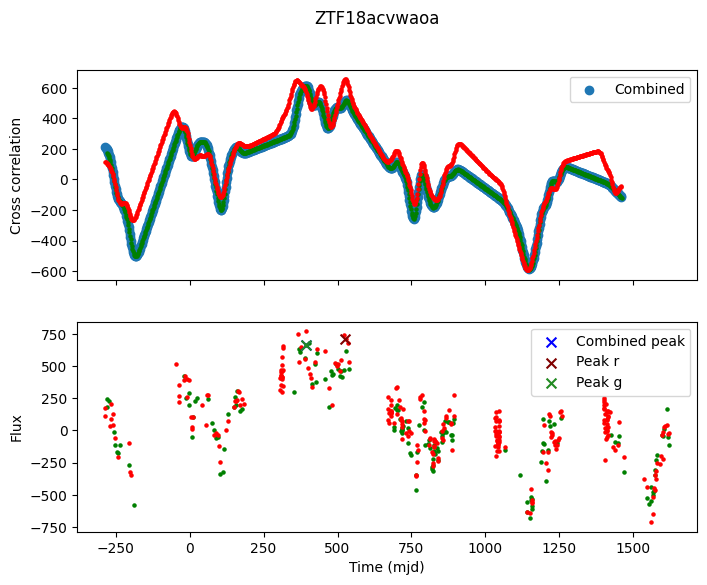

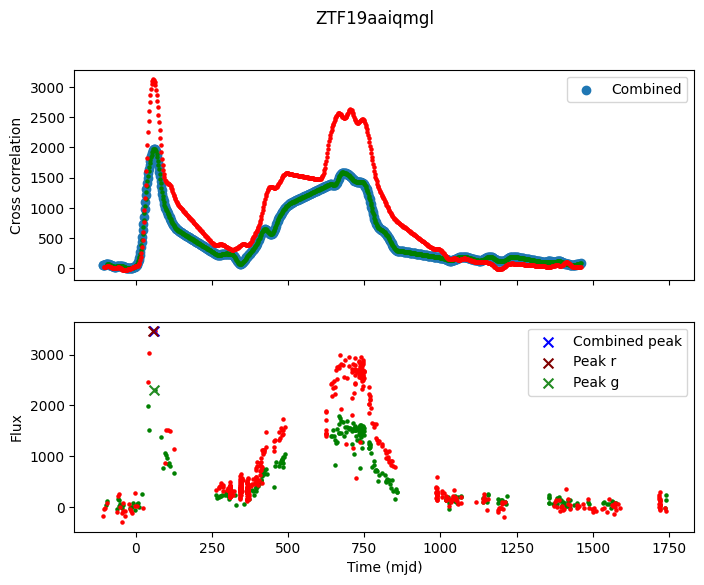

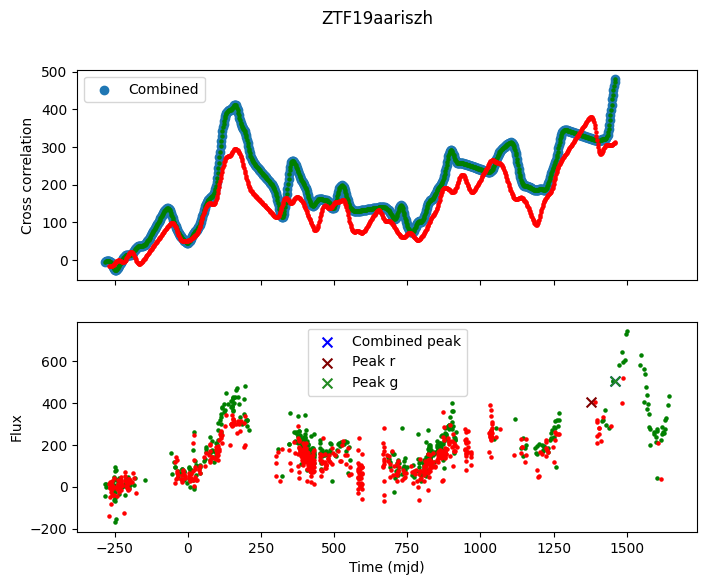

In [6]:
err_ztf = 'ZTF19adawqog'
# err_ztf = 'ZTF18acsvwfr'
def show_cross_correlation(ztf_name,path=False):
    if not path:
        err_ztf_path = os.path.join(sjoertpath,ztf_name)
    else:
        err_ztf_path = ztf_name 
        ztf_name = os.path.split(ztf_name)[-1]
        print(err_ztf_path,ztf_name)
    err_data = pd.read_csv(os.path.join(err_ztf_path,ztf_name+"_clean_data.txt"),sep='\t',comment='#',names=['time','flux','flux_unc','zeropoint','filter'])
    err_flux = err_data['flux'].values
    err_time = err_data['time'].values
    green_mask = err_data['filter'] == 'ZTF_g'
    red_mask = err_data['filter'] == 'ZTF_r'

    err_time -= 2458484.5
    cross_corr, peak, timesteps_for_gauss, best_flux = fp.cross_correlation(err_flux,err_time,interp_data=True)
    cross_corr_g, peak_g, timesteps_for_gauss_g, best_flux_g = fp.cross_correlation(err_flux[green_mask],err_time[green_mask],interp_data=True)
    cross_corr_r, peak_r, timesteps_for_gauss_r, best_flux_r = fp.cross_correlation(err_flux[red_mask],err_time[red_mask],interp_data=True)

    fig,(ax1,ax2) = plt.subplots(nrows=2,sharex=True,figsize=(8,6))
    plt.suptitle(ztf_name)
    ax1.set_ylabel("Cross correlation")
    ax1.scatter(timesteps_for_gauss,cross_corr,label='Combined')
    ax1.scatter(timesteps_for_gauss_g,cross_corr_g,c='green',s=5)
    ax1.scatter(timesteps_for_gauss_r,cross_corr_r,c='red',s=5)
    ax1.legend()
    ax2.set_ylabel("Flux")
    ax2.set_xlabel("Time (mjd)")
    ax2.scatter(err_time[green_mask],err_flux[green_mask],s=5,c='green')
    ax2.scatter(err_time[red_mask],err_flux[red_mask],s=5,c='red')
    ax2.scatter(timesteps_for_gauss[np.argmax(cross_corr)],best_flux,marker='x',c='blue',s=50,label='Combined peak',zorder=10)
    ax2.scatter(timesteps_for_gauss_r[np.argmax(cross_corr_r)],best_flux_r,marker='x',c='maroon',s=50,label='Peak r',zorder=10)
    ax2.scatter(timesteps_for_gauss_g[np.argmax(cross_corr_g)],best_flux_g,marker='x',c='forestgreen',s=50,label='Peak g',zorder=10)
    ax2.legend()
    plt.show()
    # print(timesteps_for_gauss[np.argmax(cross_corr)],np.max(cross_corr))

show_cross_correlation(err_ztf)
show_cross_correlation("ZTF18aauosxv")
show_cross_correlation("ZTF18abshxig")
# show_cross_correlation("ZTF18abtizze")
show_cross_correlation("ZTF18acvwaoa")
show_cross_correlation("ZTF19aaiqmgl")
show_cross_correlation("ZTF19aariszh")
# sampledir = r'C:\Users\timvd\Documents\Uni 2023-2024\First Research Project\Data\random_subset'
# show_cross_correlation(os.path.join(sampledir,'ZTF18aazffjy'),True)


In [8]:
# # err_ztf = 'ZTF19accdnt'
# # err_ztf = 'ZTF18aauosxv'
# err_ztf = 'ZTF18acsvwfr'
# err_ztf_path = os.path.join(sjoertpath,err_ztf)
# # print(ztf_name+"_clean_data.json")
# err_data = pd.read_csv(os.path.join(err_ztf_path,err_ztf+"_clean_data.txt"),sep='\t',comment='#',names=['time','flux','flux_unc','zeropoint','filter'])
# err_flux = err_data['flux'].values
# # print(2459783.499988 - 2458484.5)
# #721.4303355999291
# err_ztf_obj = ZTF_forced_phot(err_ztf_path)
# # err_ztf_obj.plot_clean_unclean_data()
# err_ztf_obj.fit(False)
# one,two,three =err_ztf_obj.save_params(save=True)
# print(two)


# # g = err_ztf_obj.guesses_i
# # b1,b2 = err_ztf_obj.boundings_i
# # for i in range(6):
# #     print(f"Guess: {b1[i]} < {g[i]} < {b2[i]}")


# # np.median(err_flux[err_ztf_obj.clean_filtermasks[0] & np.invert(err_ztf_obj.time_mask)])

In [9]:
def ztf_dir_finder(ztf_name):
    # if "\\" in ztf_name: #ergo a director y was given instead of a name
    #     ztf_dir = ztf_name #make self(?)
    #     ztf_name = os.path.split(ztf_dir)[-1]
    # else:
    cwd = os.getcwd()
    dir = cwd
    while not dir.endswith('First Research Project\\Data'):
        cwd = os.path.split(cwd)[0]
        dir = cwd + "\\Data"
    banlist = set(['DOWNLOADED','EMPTY','dump'])
    iterlist = sorted(set(os.listdir(dir)) - banlist)

    for folder in iterlist:
        folder_dir = os.path.join(dir,folder)
        if 'Sjoert' in folder_dir: #REMOVE THIS LATER, ONLY FOR TESTING
            if ztf_name in os.listdir(folder_dir):
                ztf_dir = os.path.join(folder_dir,ztf_name) 
                break


1.2435547397372126


8.375025117857149e-10

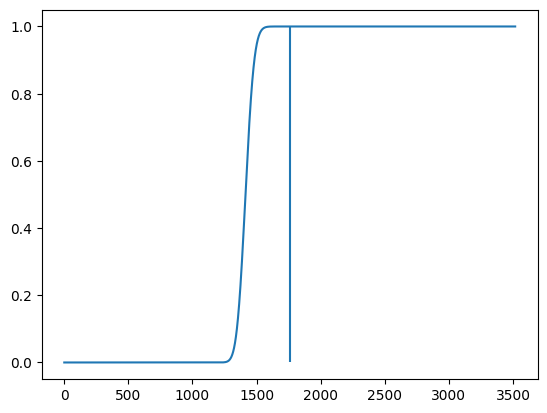

In [12]:
from scipy.stats import chi2 as chi2dist

# chi2= 5315.637385528731
# dof= 1527
chi2=1758.3864019884188 
dof=1414

print(chi2/dof)
plt.plot(np.linspace(0,2*chi2,10000),chi2dist.cdf(np.linspace(0,2*chi2,10000),dof))
plt.vlines(chi2,0,1)

1- chi2dist.cdf(chi2,dof)

Green: 4 -162.719282399863 105.510338210168
Red: 3 -167.65217590006068 116.67538785747819
Combined 3 -167.73836810002103 116.67538785747819
chi2val=5963.736303888363 and dof=896
Found chi2/dof = 6.655956


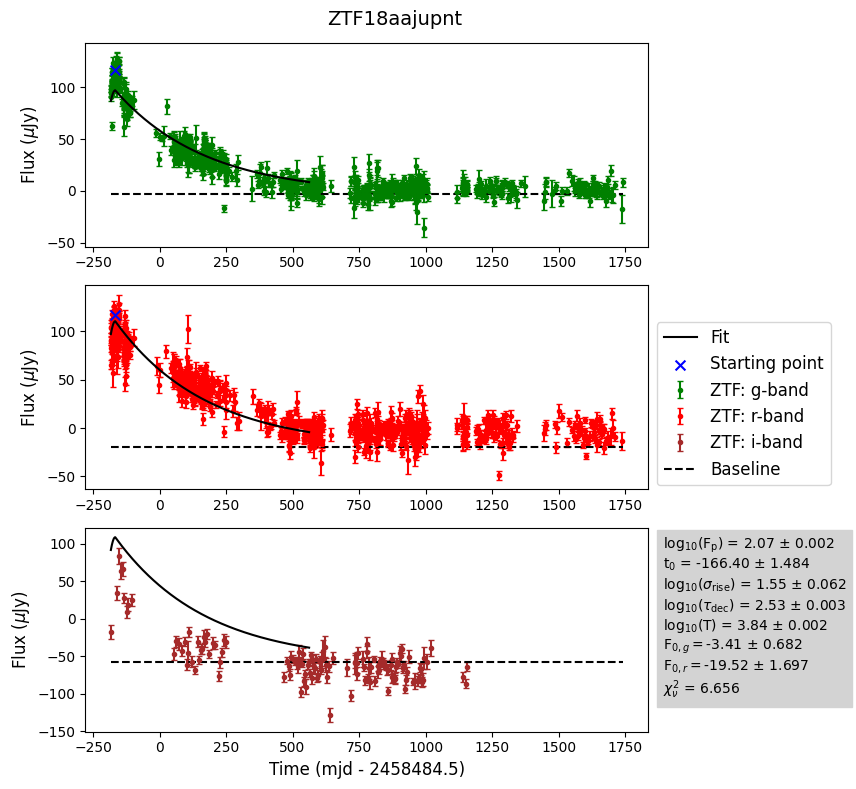

Green: 82 227.28164350008592 180.72797052716663
Red: 84 237.34831020003185 254.29719325579515
Combined 84 237.26114579988644 288.80631512728047
chi2val=5315.637385528731 and dof=1527
Found chi2/dof = 3.481098


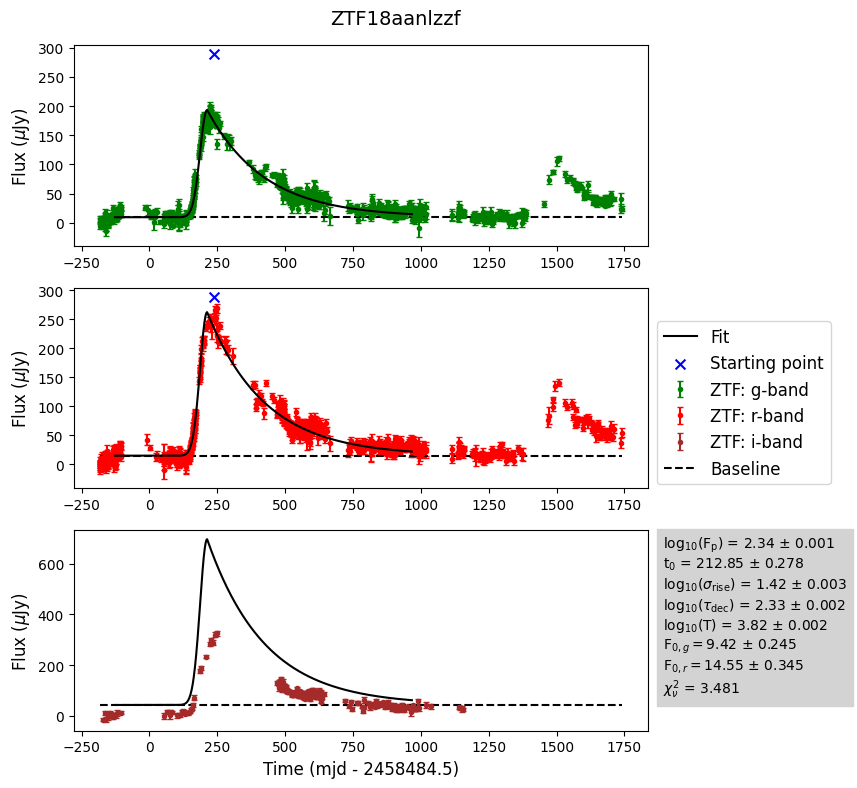

Green: 210 867.2835416998714 68.97464400310932
Red: 211 872.3463889001869 53.1556274788831
Combined 209 862.2644096999429 70.17780578756339
chi2val=11508.91243521139 and dof=899
Found chi2/dof = 12.801905


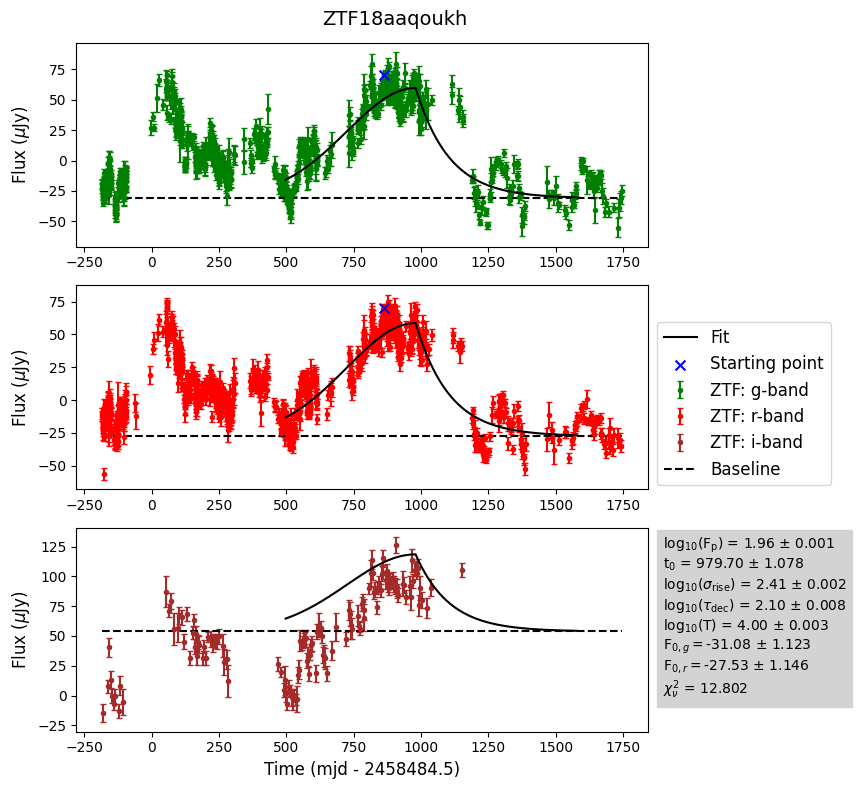

Green: 70 167.27655090019107 123.91260922662028
Red: 71 172.35064810002223 78.29335424837923
Combined 102 327.26017360016704 87.86577115691973
chi2val=53287.963977543186 and dof=1393
Found chi2/dof = 38.254102


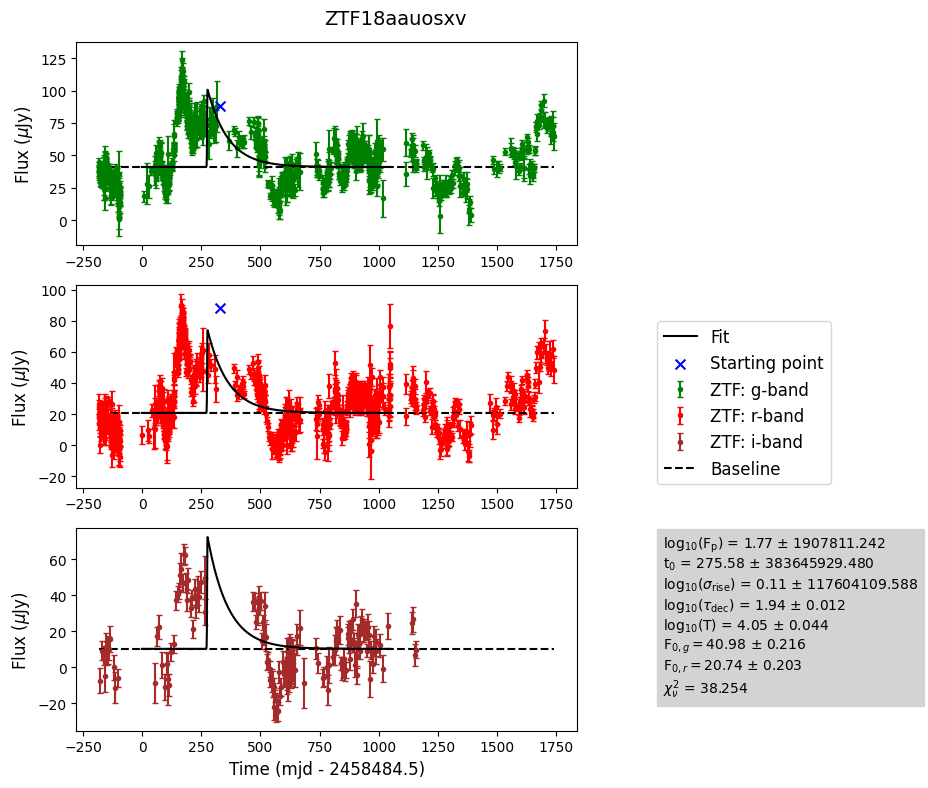

Green: 15 -107.69046299997717 32.432260039466286
Red: 15 -107.62622690014541 30.996721489586545
Combined 16 -102.69046299997717 36.05303409581859
chi2val=1758.3864019884188 and dof=1414
Found chi2/dof = 1.243555


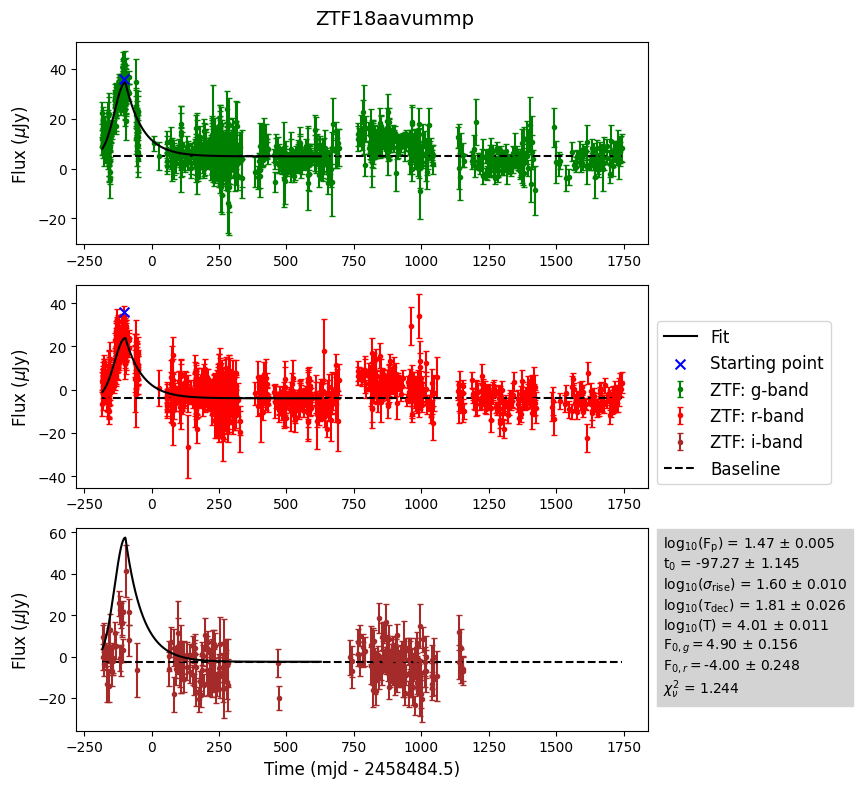

Green: 135 495.1971527999267 120.15558154017087
Red: 133 495.1753703998402 169.83958281376567
Combined 135 493.1860994999297 150.41079909142655
chi2val=1387.6348242582246 and dof=767
Found chi2/dof = 1.809172


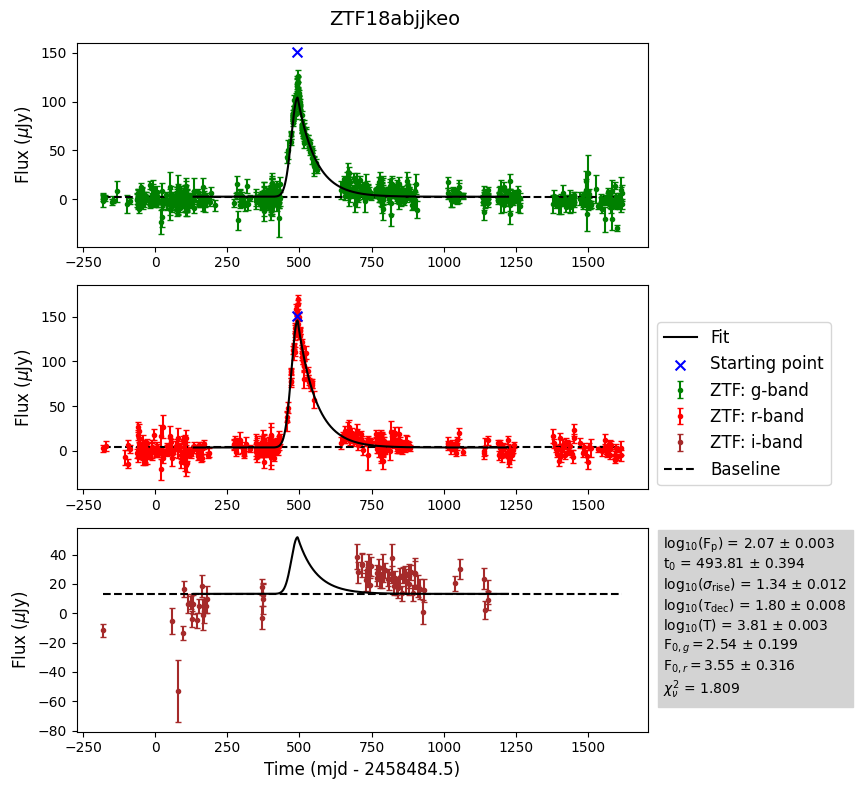

Green: 14 -107.7801156998612 81.62942407186878
Red: 32 -12.824675899930298 40.58582610493304
Combined 14 -107.82671299995854 81.62942407186878
chi2val=799.6790696001827 and dof=501
Found chi2/dof = 1.596166


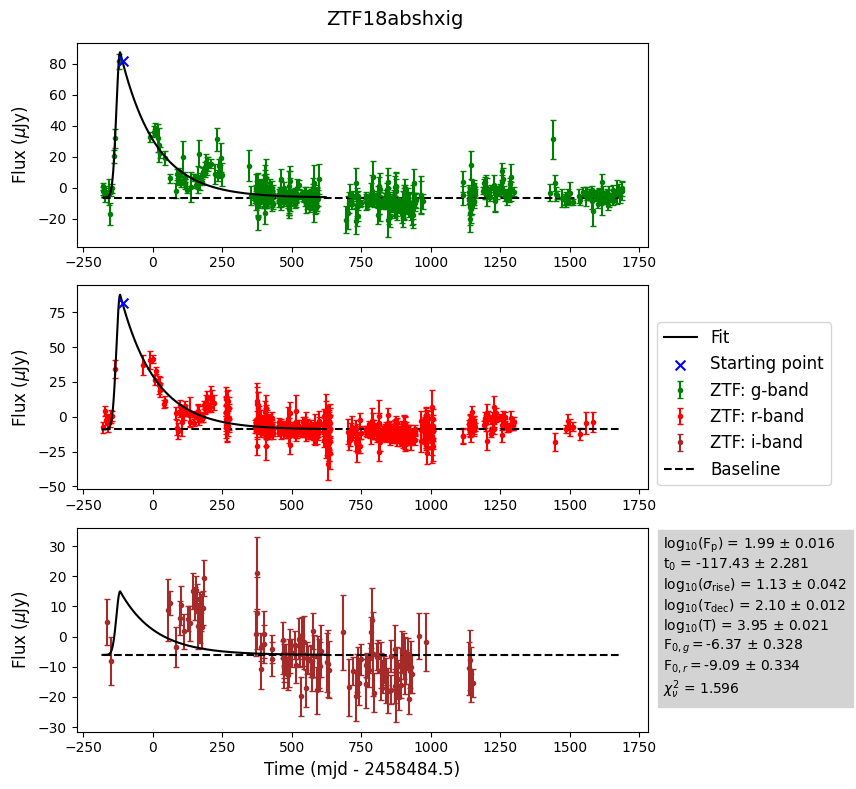

Green: 35 4.442939800210297 47.88184052484672
Red: 38 16.400023099966347 33.21916311758095
Combined 20 -80.5377198997885 43.457972191557566
chi2val=124.24925302274416 and dof=220
Found chi2/dof = 0.564769


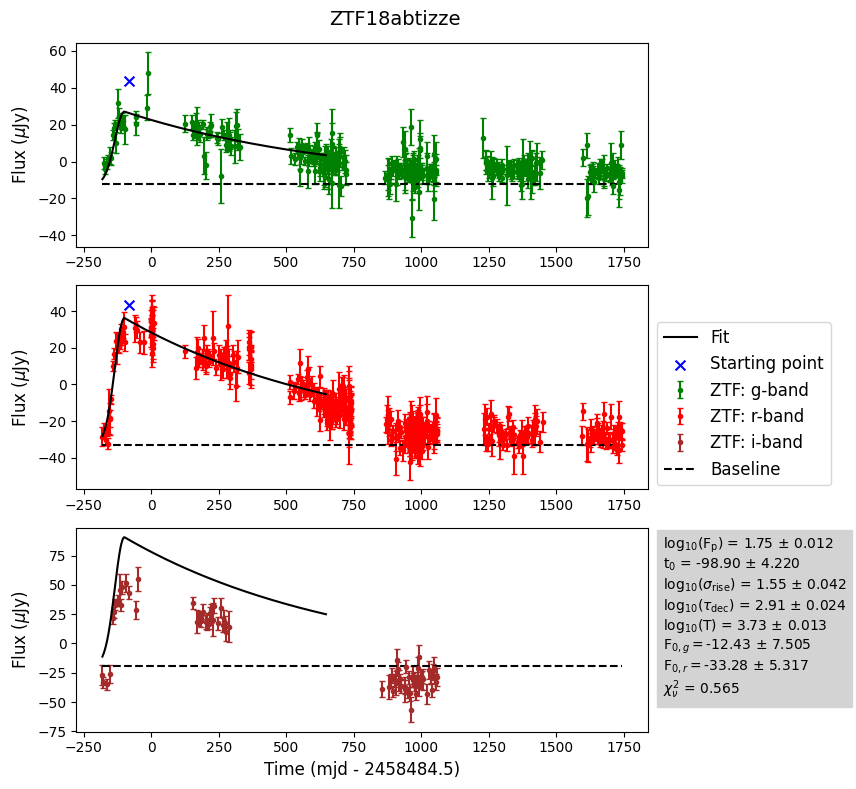

Green: 29 11.470914400182664 31.451368366979146
Red: 26 -0.49158560018986464 49.439376861900314
Combined 27 1.4709144001826644 49.439376861900314
chi2val=7485.249223562325 and dof=1169
Found chi2/dof = 6.403122


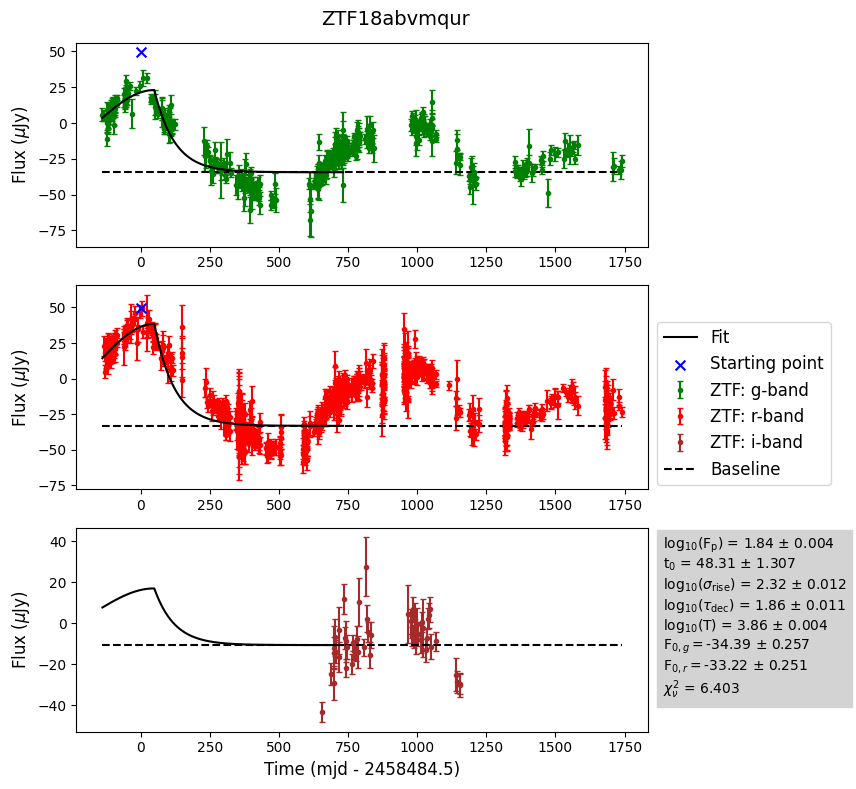

Green: 12 -47.50292820017785 29.421991227457404
Red: 12 -47.48041669977829 53.969756789416266
Combined 14 -40.494733800180256 28.51841192769911
chi2val=522.2208668545644 and dof=643
Found chi2/dof = 0.812163


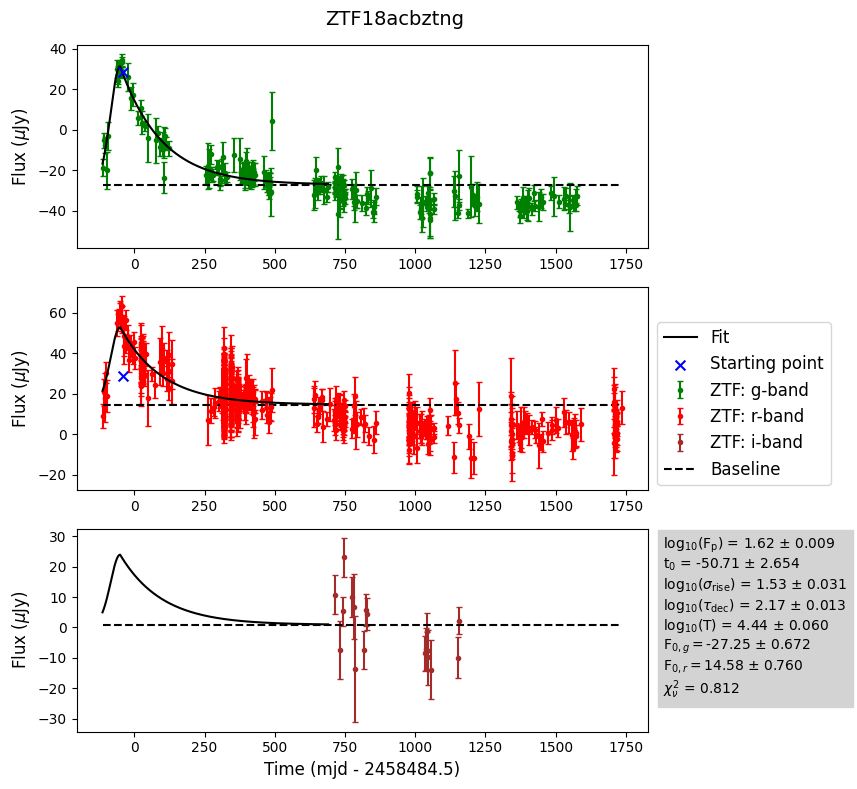

Green: 47 179.5410532001406 55.44772127262349
Red: 62 254.50141200004146 73.86949846732573
Combined 62 251.5401968001388 73.86949846732573
chi2val=2314.9880131307245 and dof=589
Found chi2/dof = 3.930370


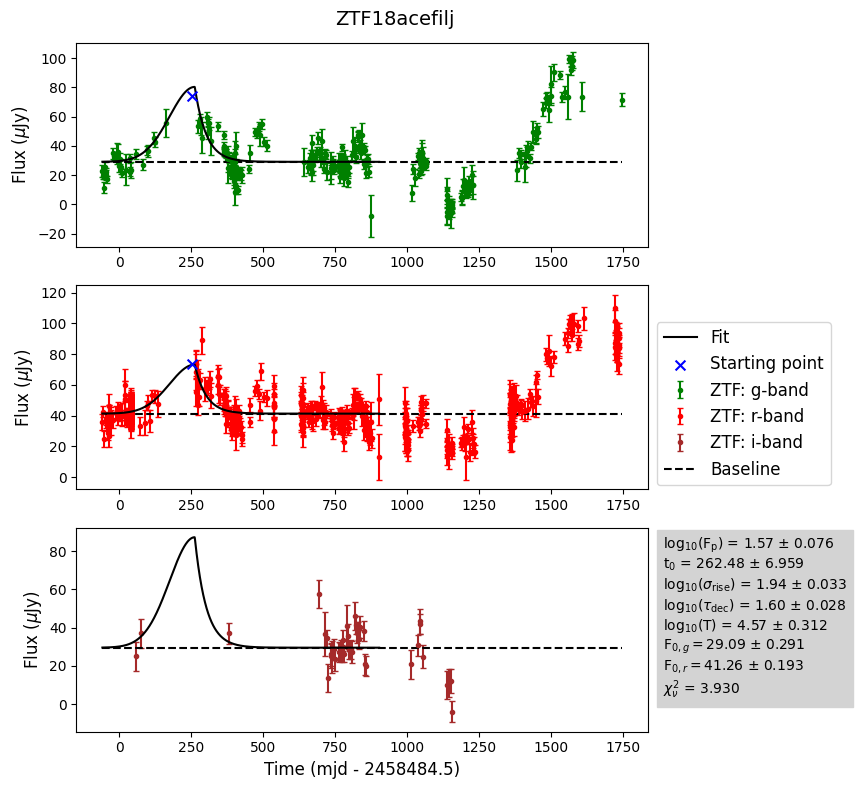

Green: 19 -26.502175900153816 168.81832841297015
Red: 20 -24.49603010015562 254.36635395749283
Combined 19 -29.539201399777085 254.01461163581155
chi2val=815.2685689478111 and dof=323
Found chi2/dof = 2.524051


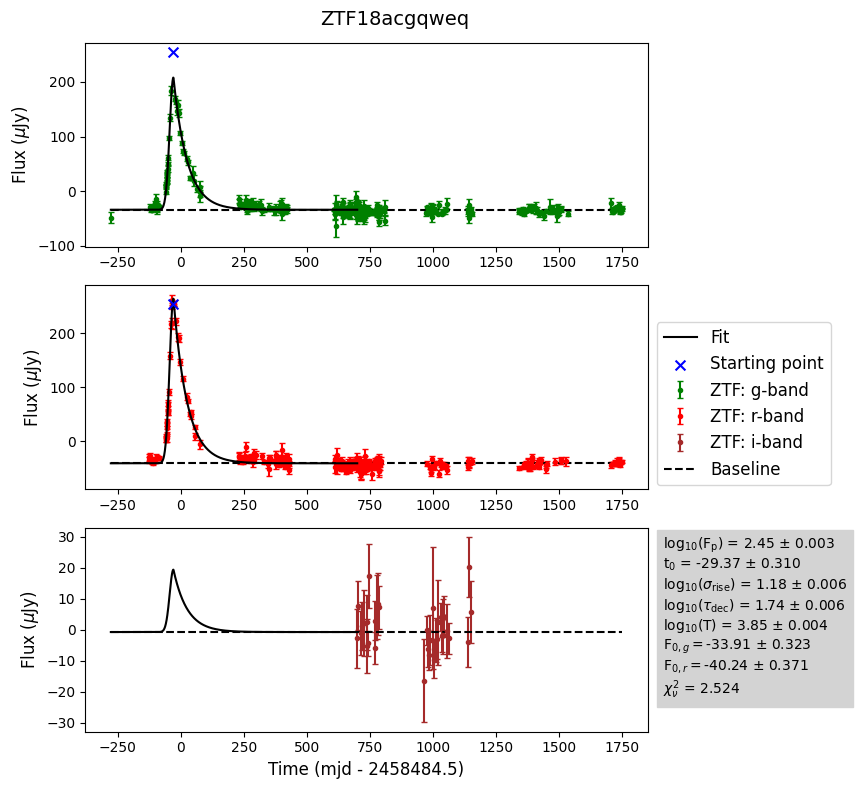

Green: 29 -8.517442100215703 94.68835627936939
Red: 29 -15.516712999902666 58.672745639368635
Combined 30 -13.516365699935704 81.70119594442421
chi2val=952.3574088925836 and dof=417
Found chi2/dof = 2.283831


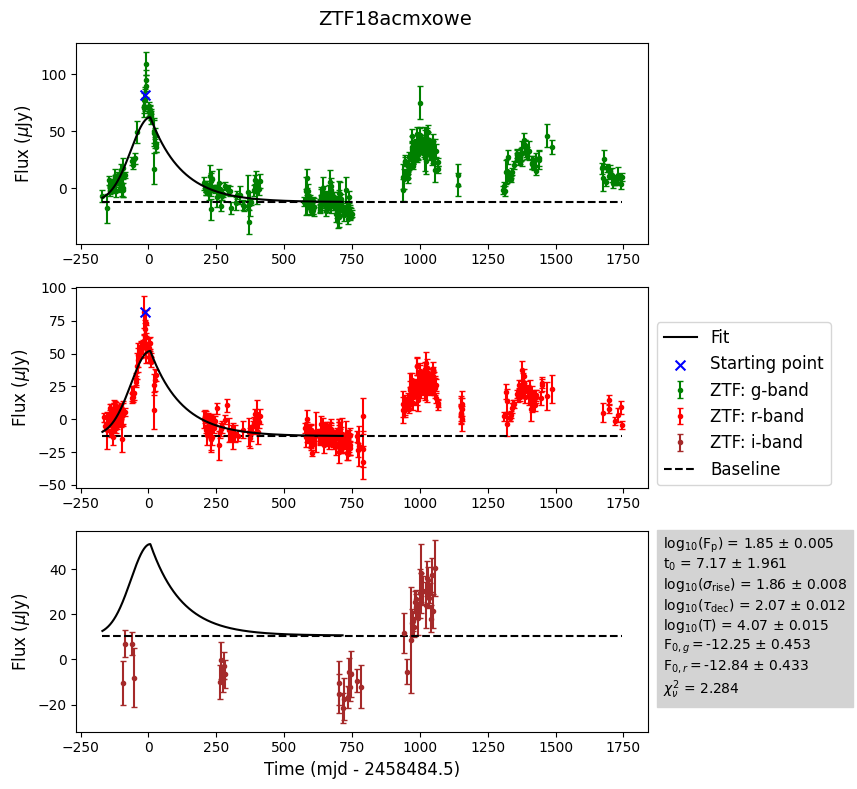

Green: 24 13.50711809983477 52.82892032815671
Red: 28 39.52814809978008 43.779031808996606
Combined 31 45.52201389987022 52.67525504347106
chi2val=953.9093708521323 and dof=679
Found chi2/dof = 1.404874


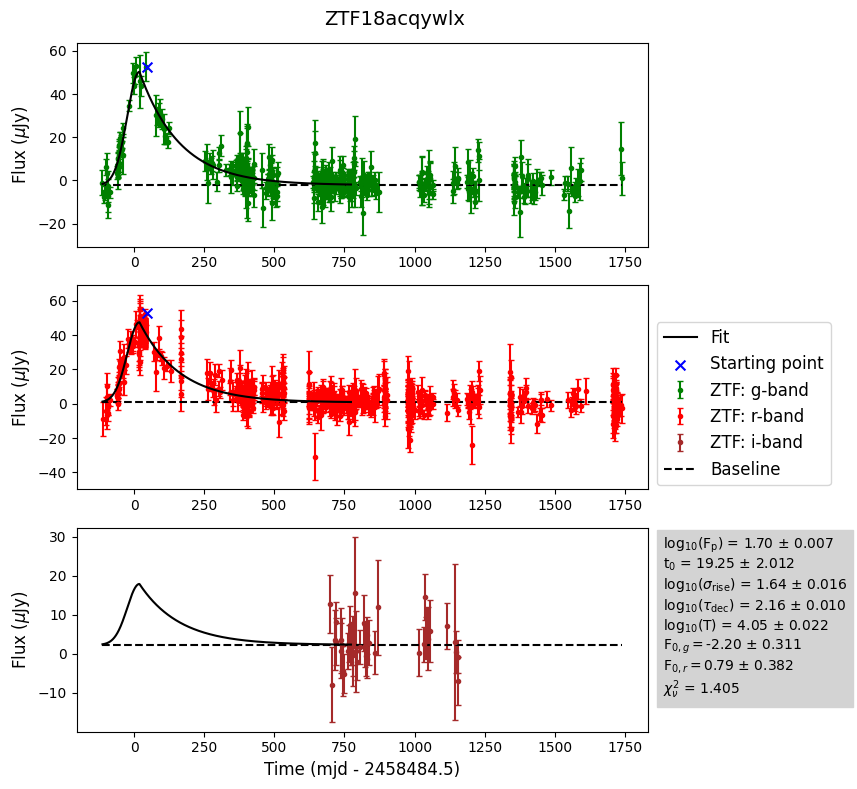

Green: 31 -24.806747700087726 34.4710207464103
Red: 31 -24.823148100171238 47.30609284955512
Combined 32 -22.74459489993751 37.755424909138405
chi2val=726.301929271639 and dof=378
Found chi2/dof = 1.921434


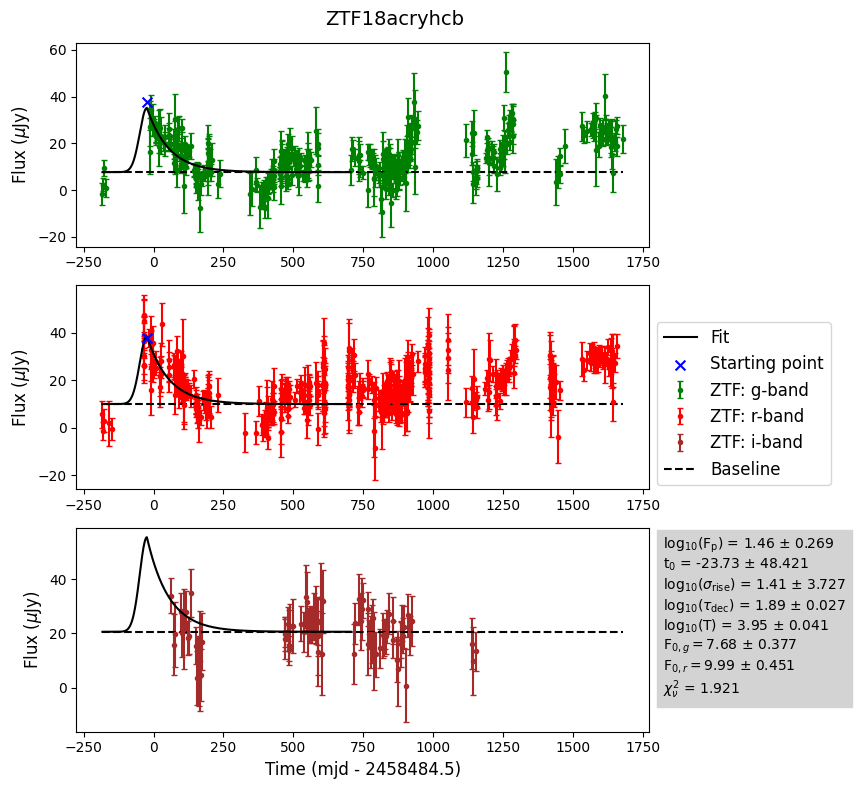

Green: 62 131.47627309989184 58.89010614756394
Red: 55 105.42112269997597 72.34122547869251
Combined 57 106.40039349999279 72.34122547869251
chi2val=1305.5619529351775 and dof=690
Found chi2/dof = 1.892119


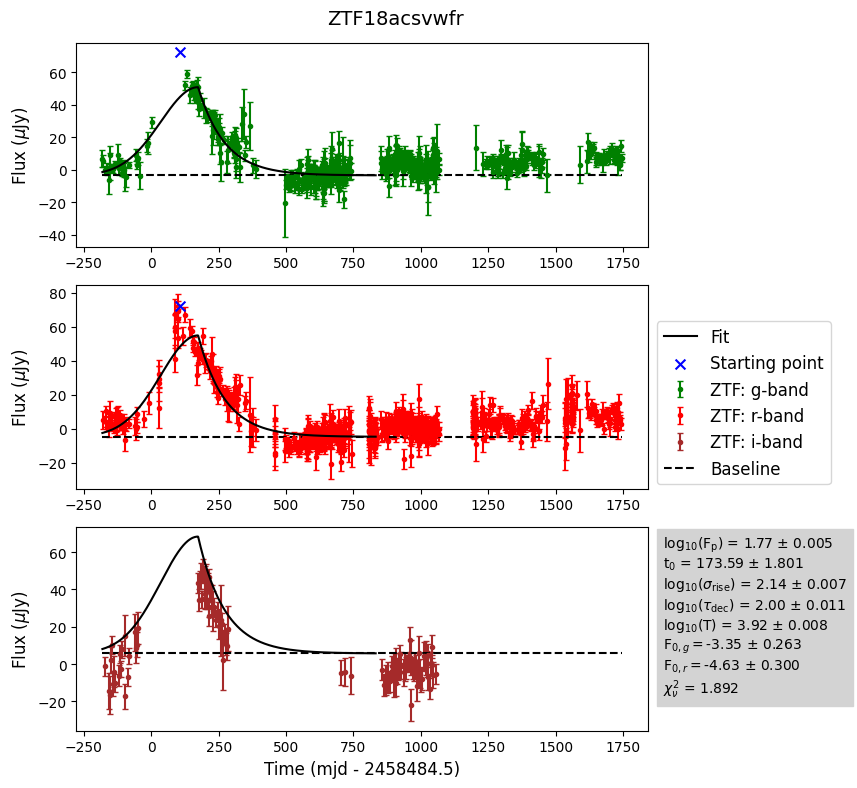

Green: 104 380.48506940016523 58.8916677673761
Red: 103 378.45209489995614 53.540139469894676
Combined 104 380.47762730019167 58.8916677673761
chi2val=1313.3704888303882 and dof=379
Found chi2/dof = 3.465357


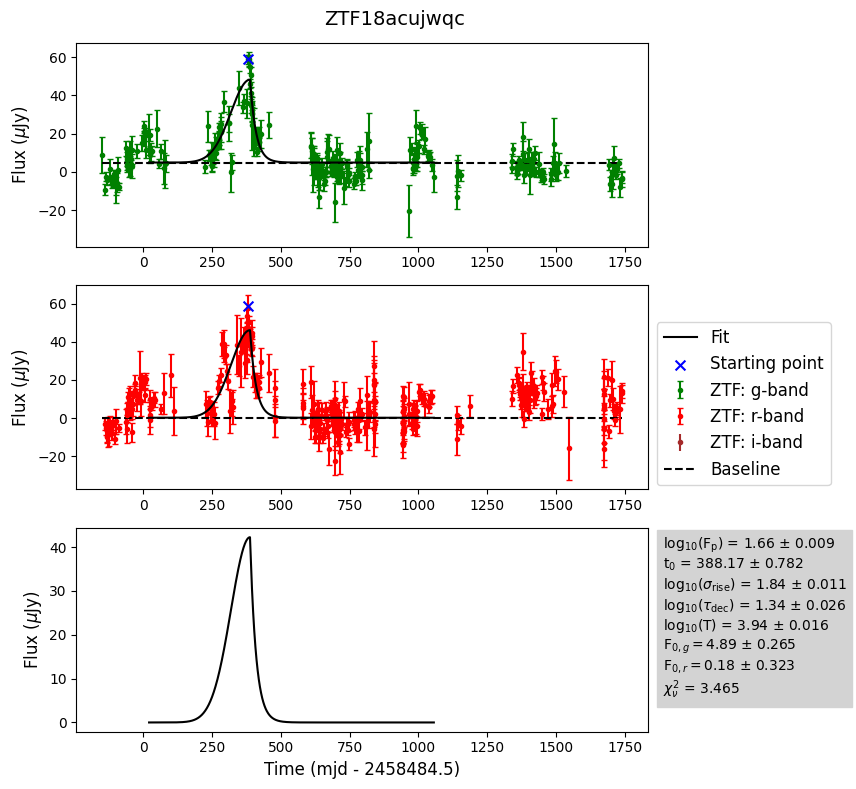

Green: 46 123.50711809983477 74.01226239403954
Red: 43 114.52814809978008 61.54224923205061
Combined 45 115.52201389987022 73.47837512846296
chi2val=4380.254744692912 and dof=744
Found chi2/dof = 5.887439


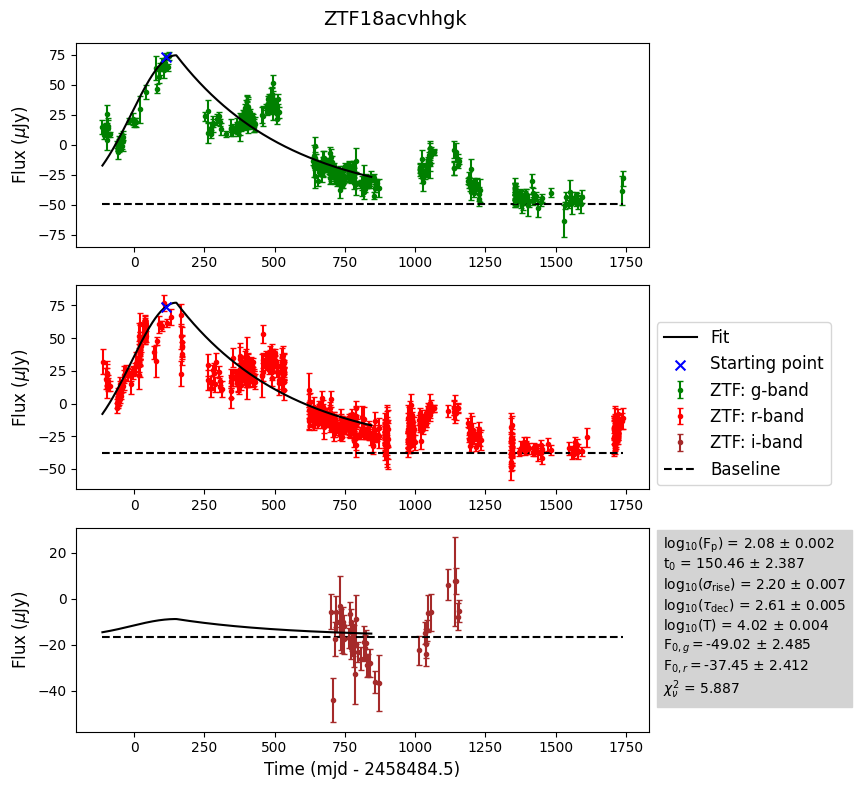

Green: 29 40.48343749996275 98.45471881801369
Red: 39 87.52394679980353 157.25346008594144
Combined 35 67.49753470020369 168.59819518509792
chi2val=1230.3074481824642 and dof=470
Found chi2/dof = 2.617675


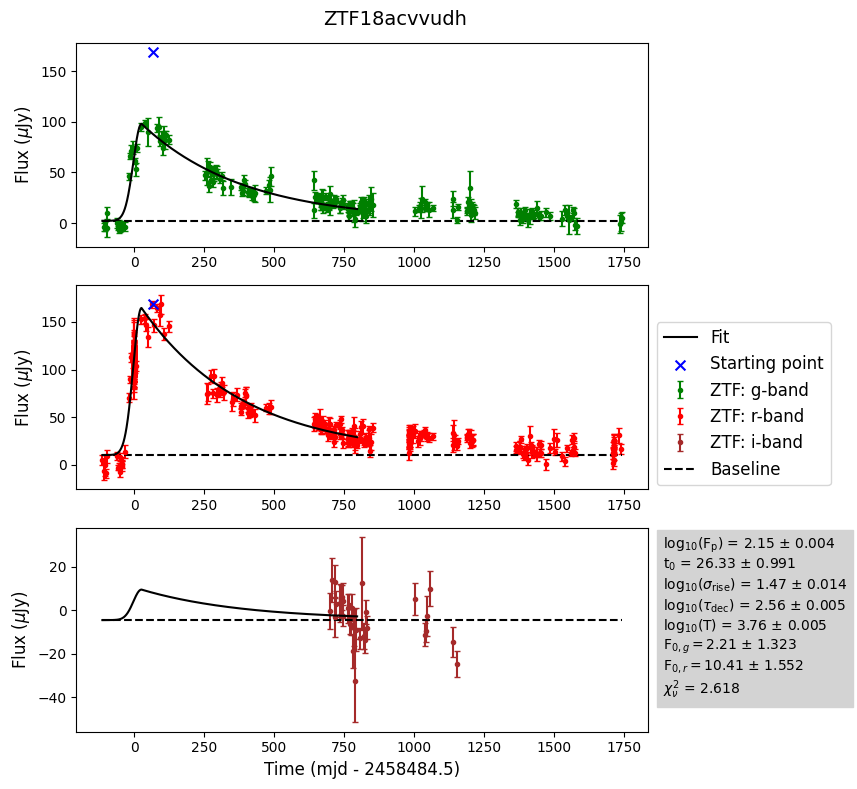

Green: 134 390.3179398002103 71.27441191016949
Red: 145 440.3144328999333 102.34490614615399
Combined 165 540.3144328999333 83.26675906592253
chi2val=4621.996259688522 and dof=277
Found chi2/dof = 16.685907


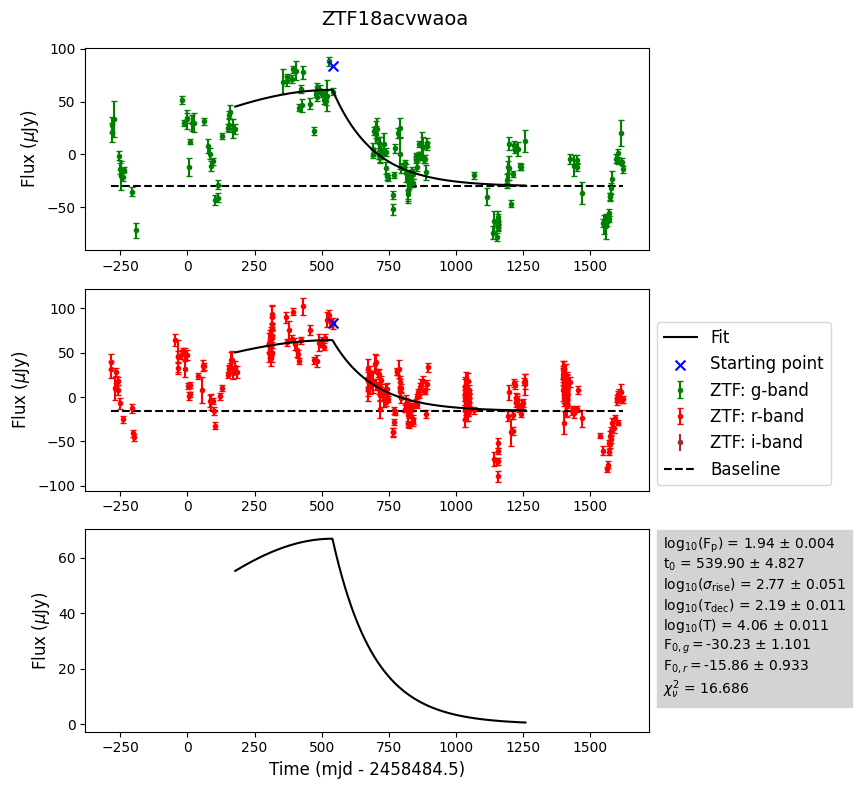

Green: 32 20.483229199890047 105.01810268059542
Red: 33 25.478530100081116 139.97900201225497
Combined 34 24.481493100058287 115.653751782364
chi2val=10429.208780444307 and dof=683
Found chi2/dof = 15.269705


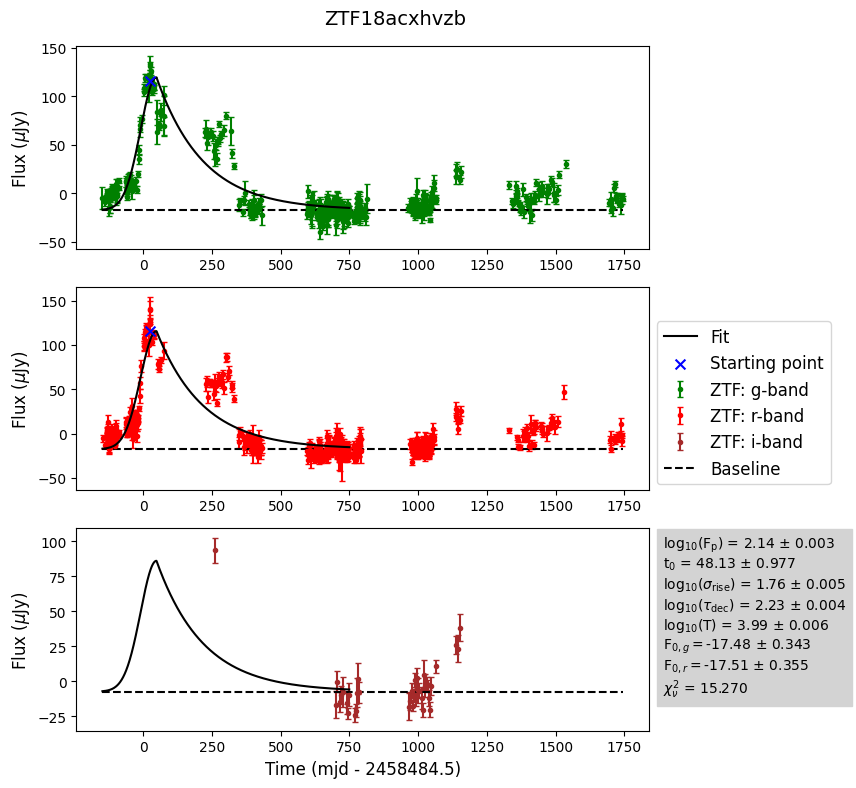

Green: 39 15.195092599838972 49.78443098174182
Red: 39 15.178703700192273 74.4745318006364
Combined 39 12.256782399956137 109.9829303420156
chi2val=1105.0727362426592 and dof=435
Found chi2/dof = 2.540397


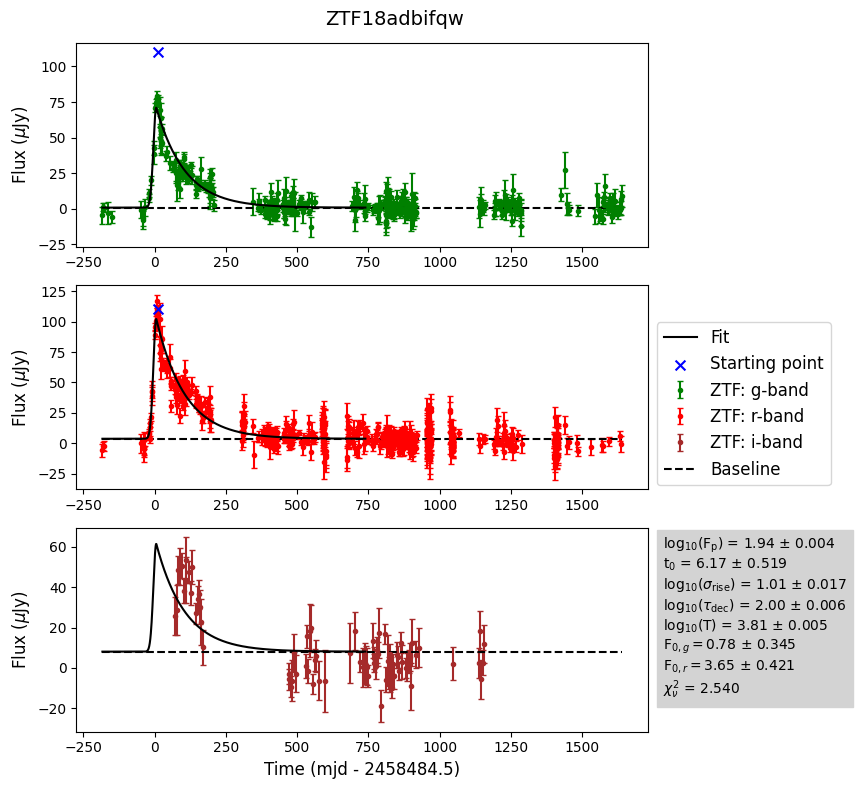

Green: 70 170.1913888999261 470.88287125692835
Red: 70 173.2084143999964 763.1156587224657
Combined 77 203.17093749996275 687.8588202195114
chi2val=41723.10066465949 and dof=522
Found chi2/dof = 79.929312


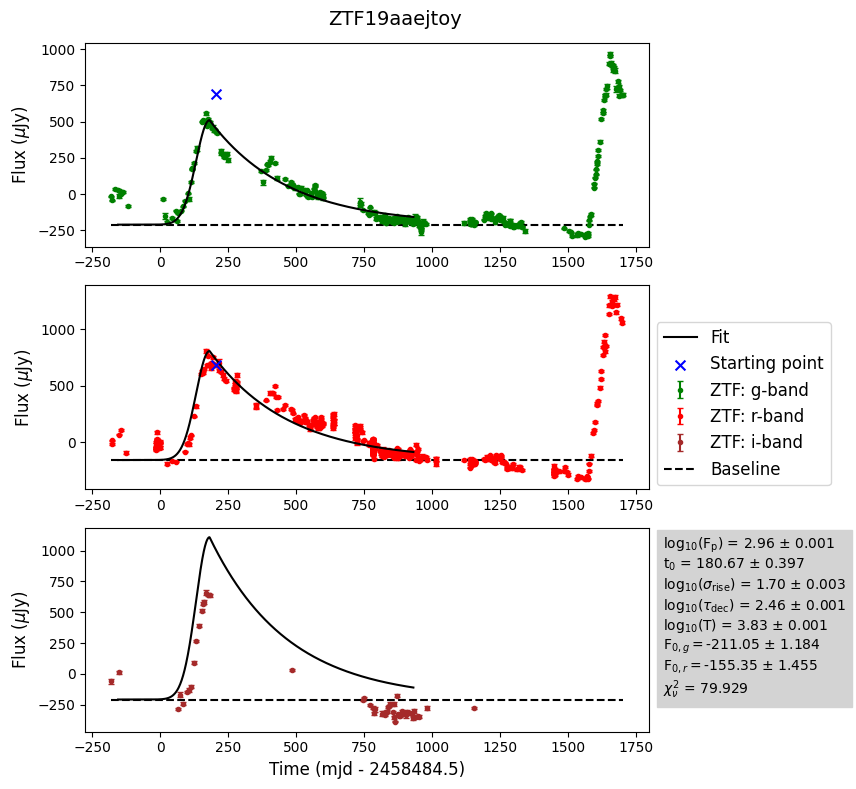

Green: 78 212.2189583000727 180.8233127114579
Red: 73 192.17148149991408 183.92744879575298
Combined 79 217.19304399983957 177.92635082243484
chi2val=3219.7440947077716 and dof=685
Found chi2/dof = 4.700356


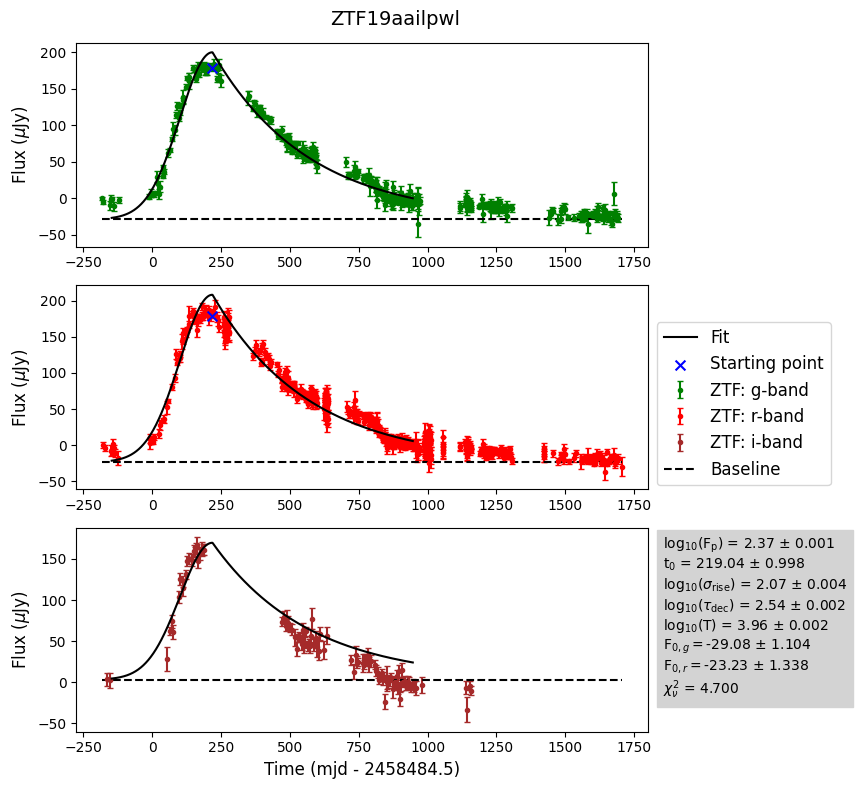

Green: 29 51.49832180002704 335.0448172527906
Red: 33 59.52307870006189 416.01462072370805
Combined 144 614.5230787000619 376.5411064635409
chi2val=15284.106191681942 and dof=802
Found chi2/dof = 19.057489


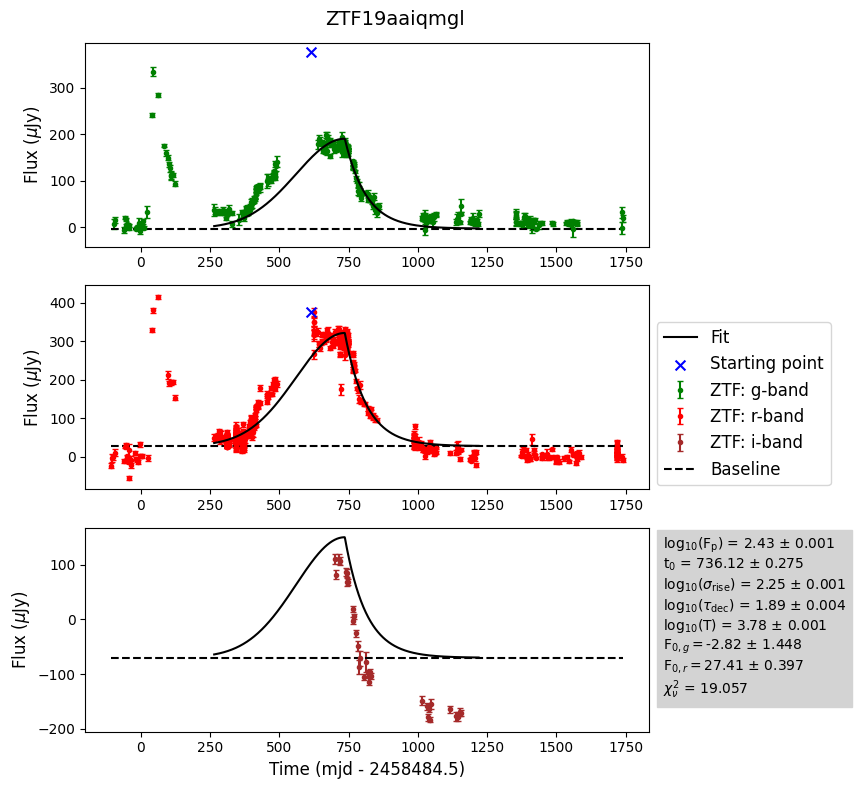

Green: 45 42.2877198997885 49.04456456103548
Red: 45 42.37237269990146 45.853126876193635
Combined 45 42.2877198997885 45.853126876193635
chi2val=2056.8787557160063 and dof=1414
Found chi2/dof = 1.454653


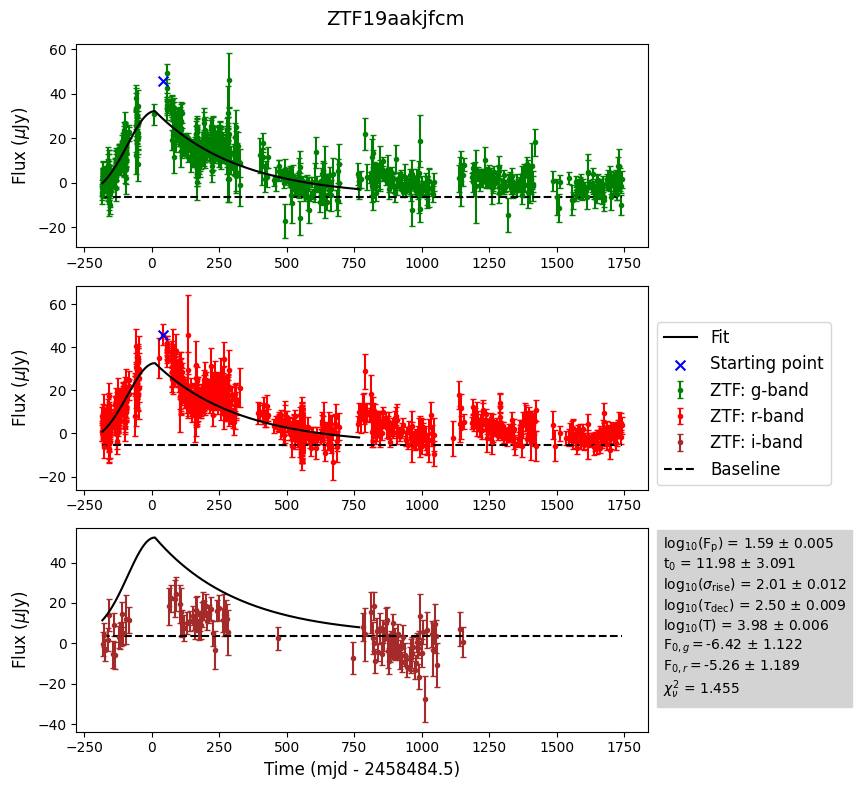

Green: 51 77.22368060005829 51.876777385029385
Red: 49 80.2123380000703 39.835372664591496
Combined 51 74.20438659982756 41.23774017241739
chi2val=819.0284230983848 and dof=798
Found chi2/dof = 1.026351


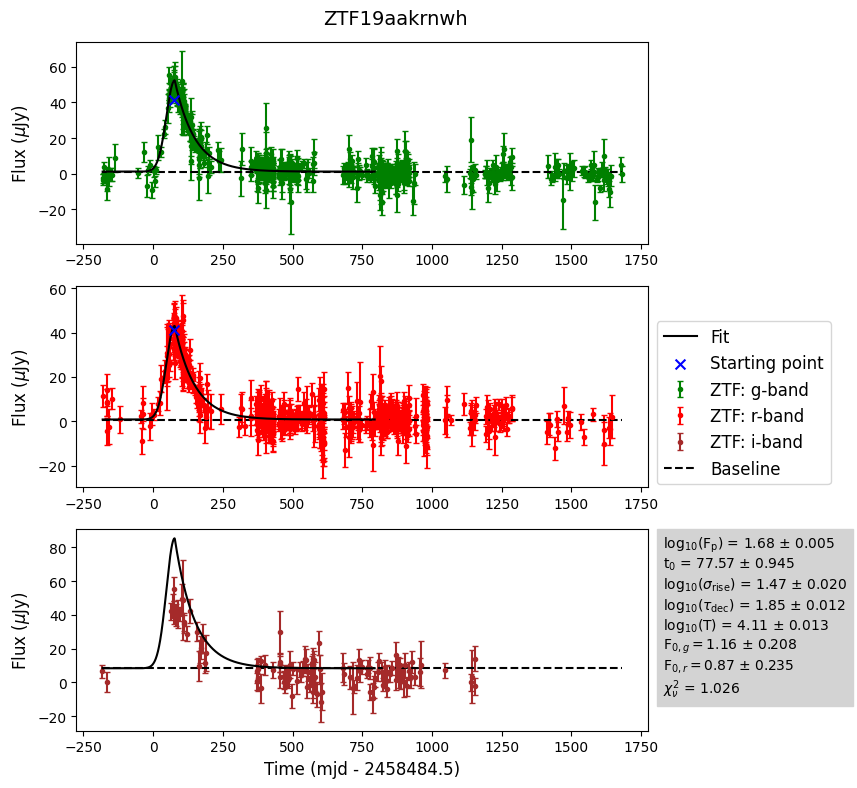

Green: 62 129.20624999981374 32.77581195075723
Red: 54 93.18114579981193 30.79943690642364
Combined 53 83.30704860016704 36.172646682120565
chi2val=2034.3546474489208 and dof=858
Found chi2/dof = 2.371043


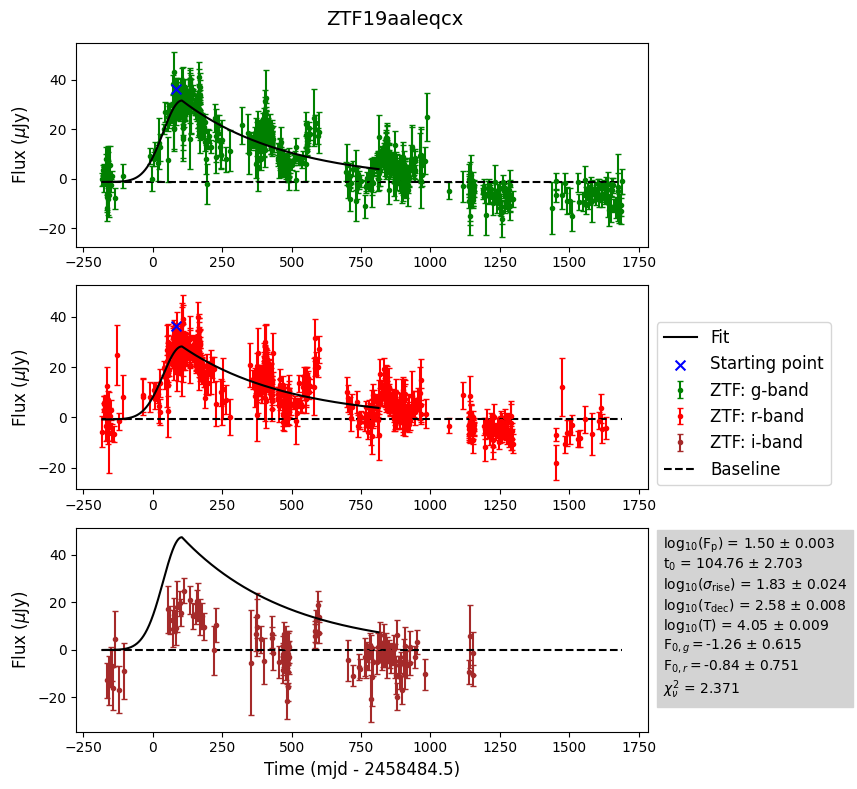

Green: 74 187.28677080012858 54.78700278159033
Red: 75 192.37192129995674 52.58143234879528
Combined 76 197.28677080012858 56.12101399215995
chi2val=6412.721132089951 and dof=1497
Found chi2/dof = 4.283715


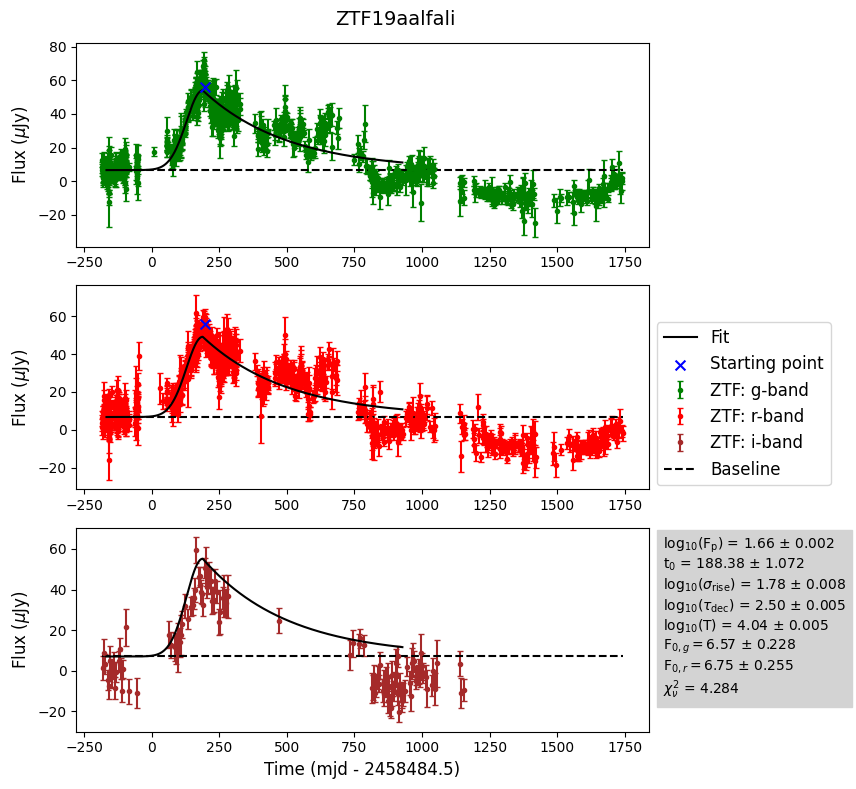

Green: 54 92.31569440010935 61.00421484488948
Red: 54 92.35996530018747 76.29697825298689
Combined 55 94.29418980004266 57.84638005115984
chi2val=857.4228916039922 and dof=789
Found chi2/dof = 1.086721


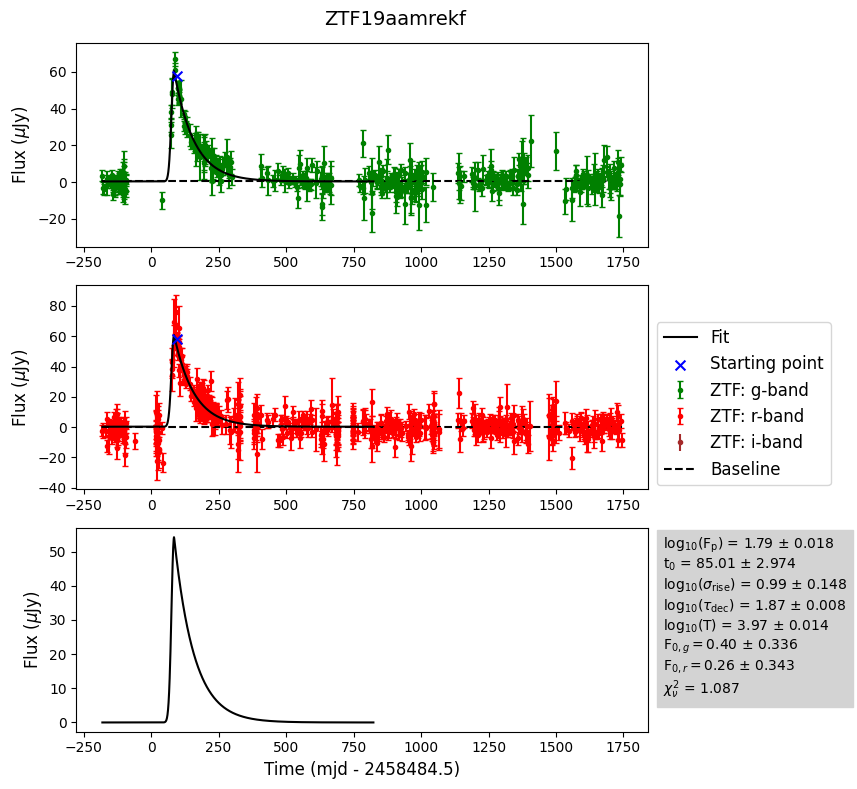

Green: 47 179.5440508997999 83.06288244204335
Red: 45 169.5018750000745 98.38920534536045
Combined 48 181.52333329990506 98.38920534536045
chi2val=772.4610844466525 and dof=428
Found chi2/dof = 1.804816


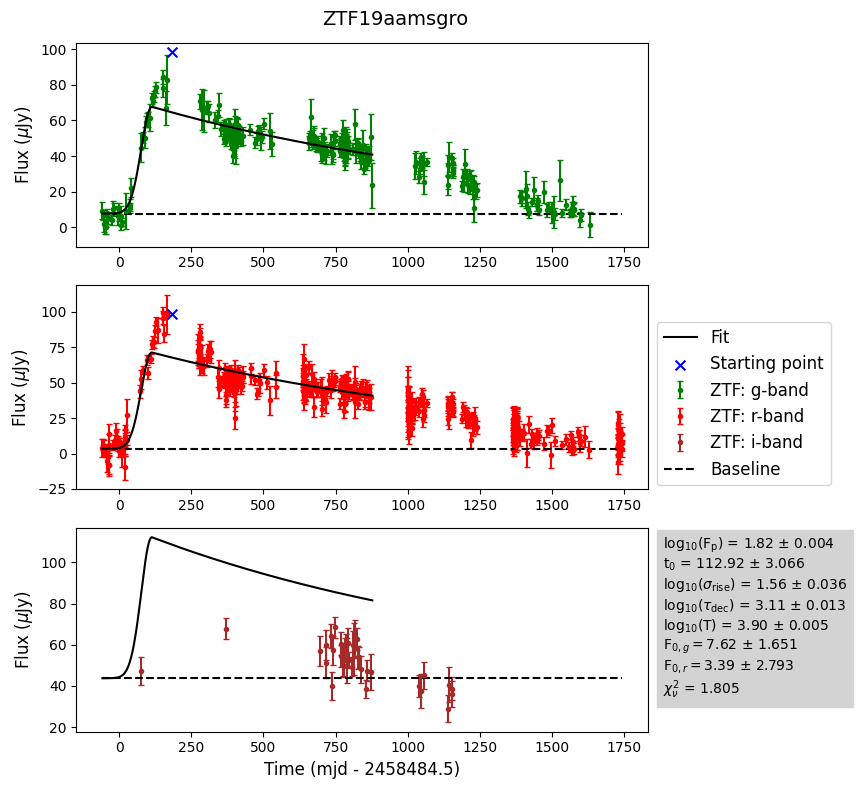

Green: 44 159.4674999997951 31.933558057137123
Red: 51 160.52895830012858 87.39559533014028
Combined 48 145.52895830012858 154.38880917042164
chi2val=2636.71246948821 and dof=1039
Found chi2/dof = 2.537741


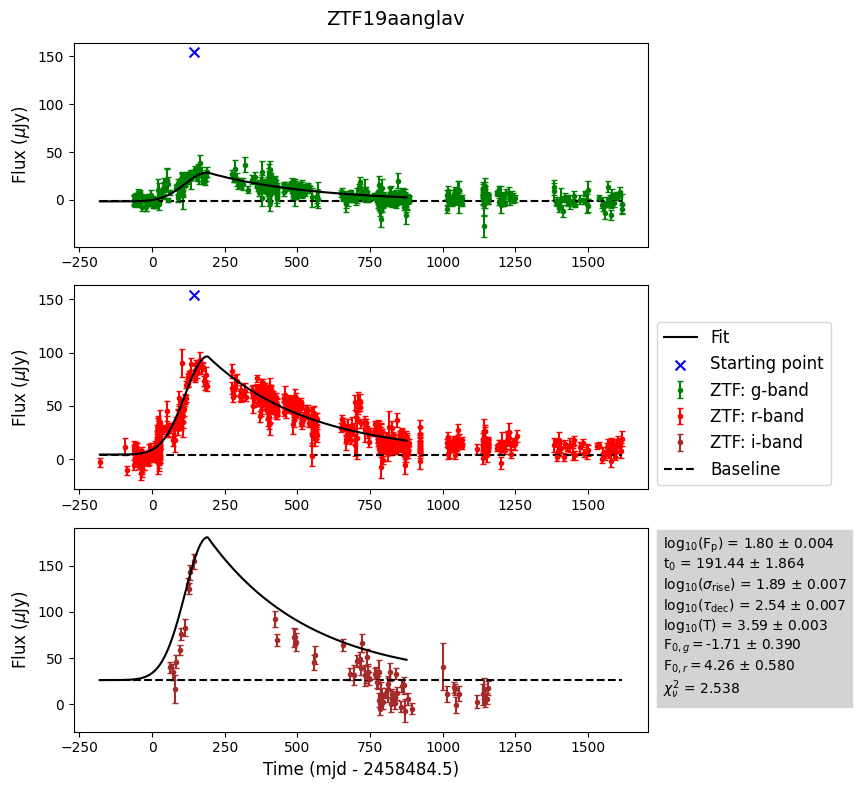

No viable g or r data in ZTF19aaohxwd. Skipping this instance.
Green: 60 126.35630790004507 274.1706377854049
Red: 61 131.3976968000643 256.8921372603101
Combined 63 134.3727778000757 267.72256252789816
chi2val=2984.6984227233224 and dof=587
Found chi2/dof = 5.084665


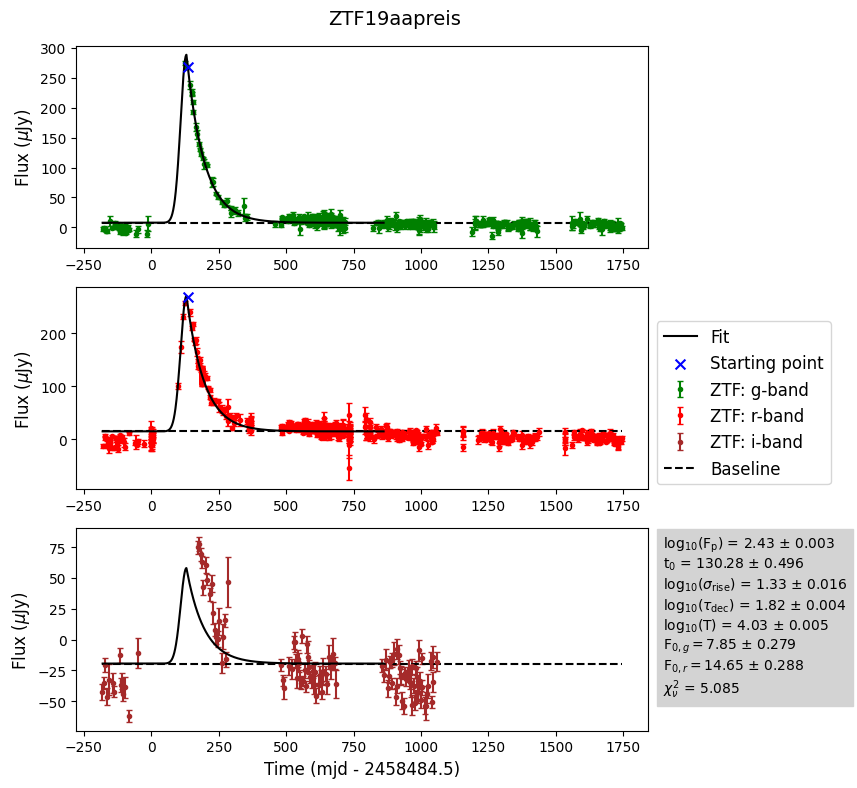

Green: 65 142.28116900008172 41.844351713975065
Red: 65 142.34878470003605 45.86452112976079
Combined 66 147.26068289997056 38.16040393318841
chi2val=7739.1564470892445 and dof=1223
Found chi2/dof = 6.328010


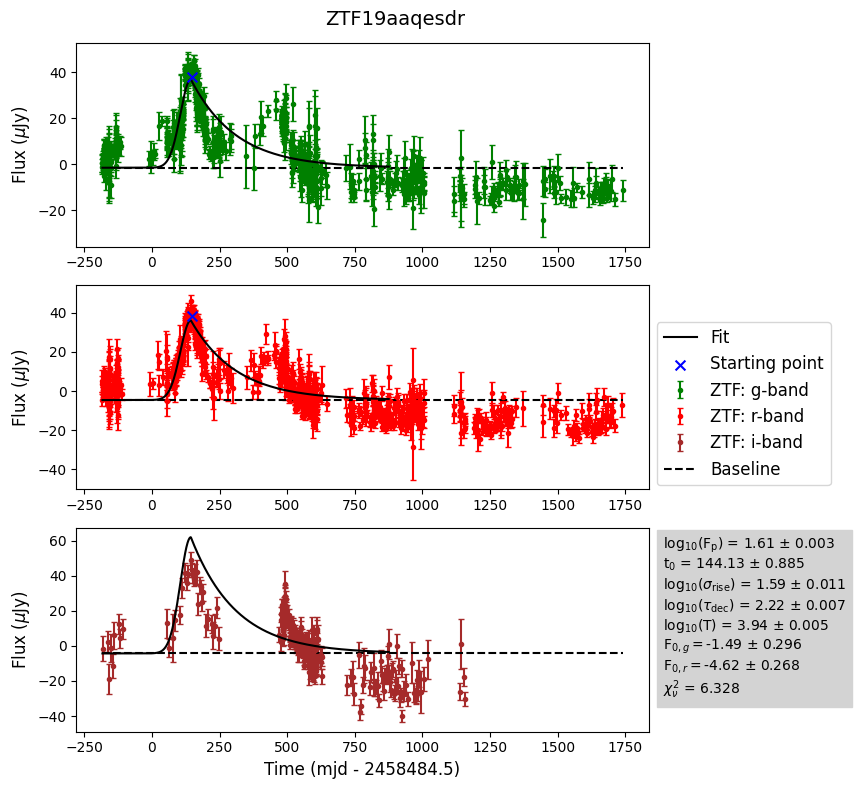

Green: 88 158.3140162001364 44.79960127547708
Red: 329 1377.2401041998528 50.41029936897486
Combined 332 1378.3140162001364 50.41029936897486
chi2val=850.6040491164538 and dof=135
Found chi2/dof = 6.300771


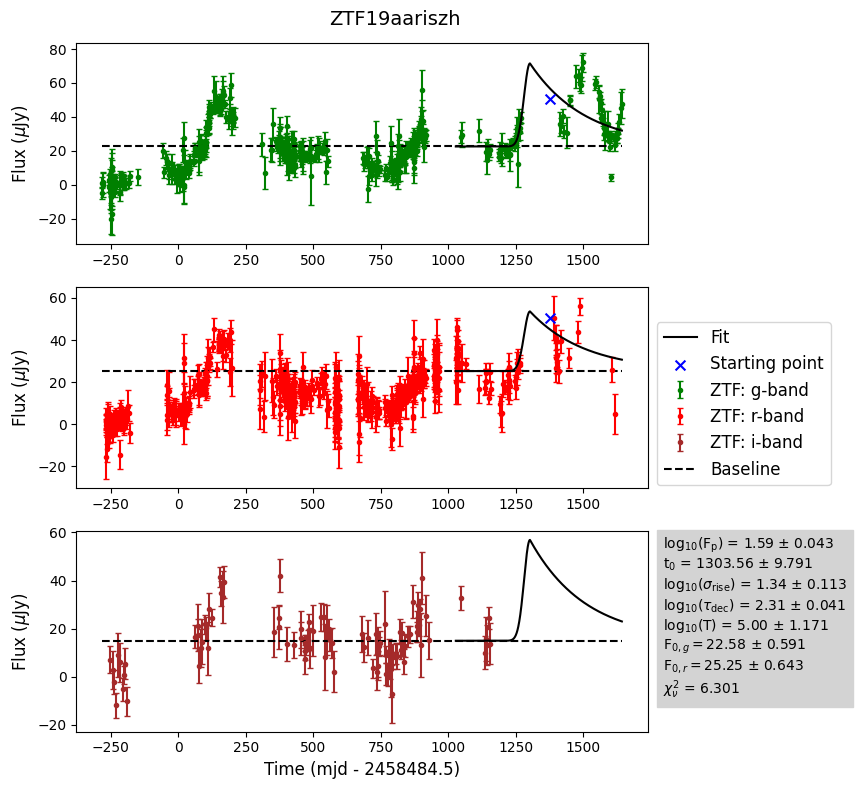

Green: 69 167.21942130010575 39.817210650979895
Red: 74 197.17241899995133 48.8437177714296
Combined 69 167.17283560009673 39.817210650979895
chi2val=979.9271197353219 and dof=546
Found chi2/dof = 1.794738


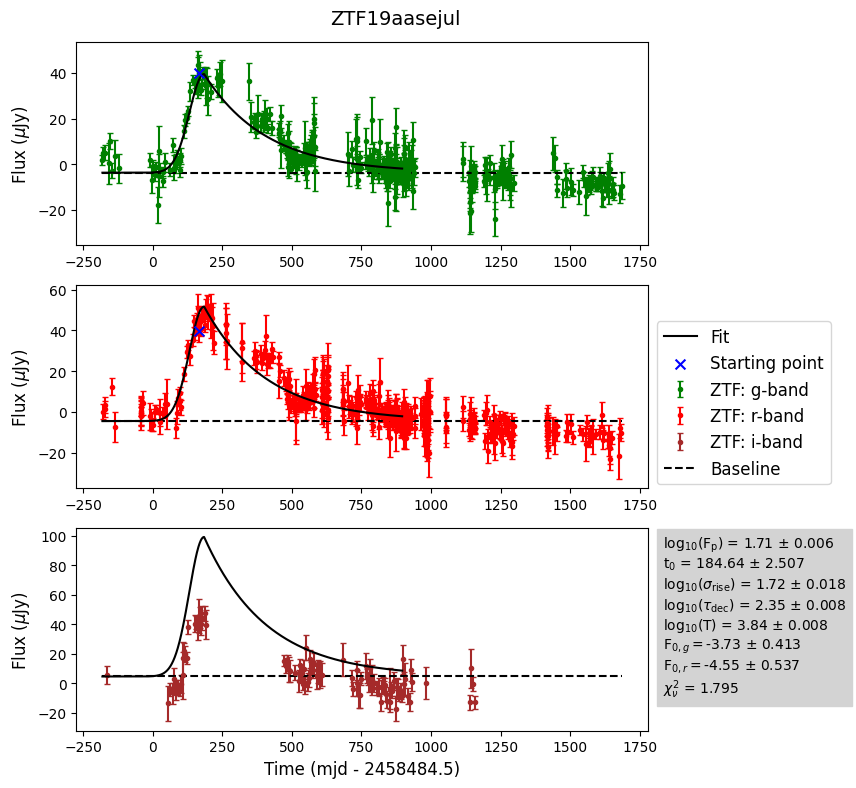

Green: 64 148.46688660001382 27.71196383705764
Red: 59 123.42675929982215 79.12681634534482
Combined 61 124.4432291998528 79.12681634534482
chi2val=413.9236436554987 and dof=464
Found chi2/dof = 0.892077


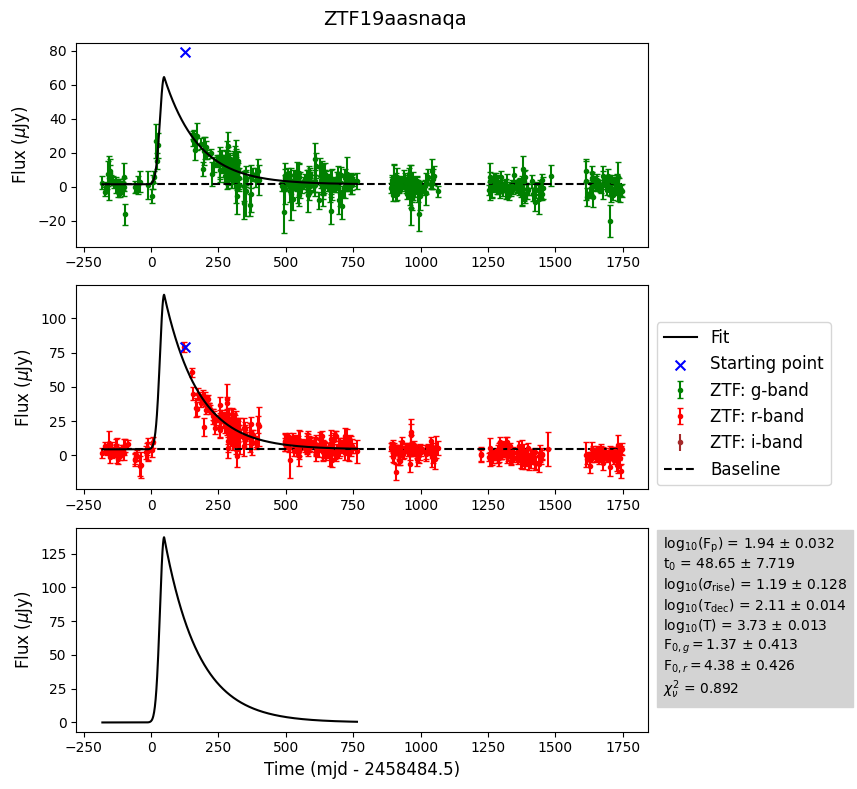

Green: 80 217.29983799997717 190.30798014640055
Red: 81 222.35157410008833 228.56944648107546
Combined 81 222.27512730006129 206.8872715120087
chi2val=6977.705442556809 and dof=1290
Found chi2/dof = 5.409074


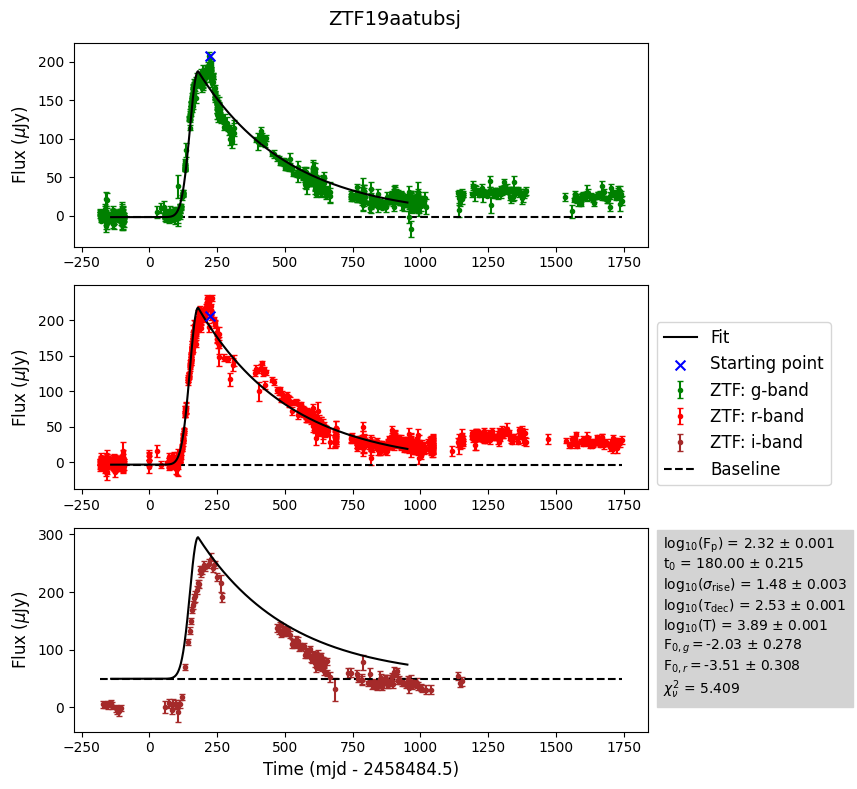

Green: 69 193.17525460012257 52.99268671759793
Red: 76 201.1795717999339 45.190841491745644
Combined 76 201.1795717999339 58.859827770140086
chi2val=1084.3348731941464 and dof=511
Found chi2/dof = 2.121986


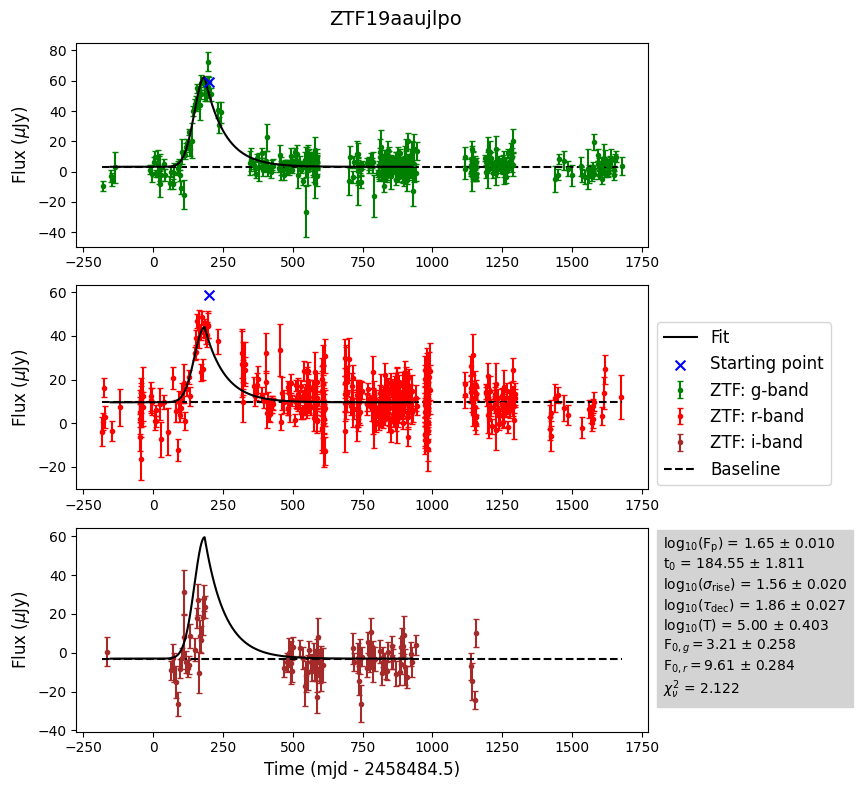

Green: 69 162.29202549997717 56.10367413120716
Red: 70 167.36258100019768 75.5429529376472
Combined 70 167.29202549997717 47.478585226513246
chi2val=4557.324290179267 and dof=1454
Found chi2/dof = 3.134336


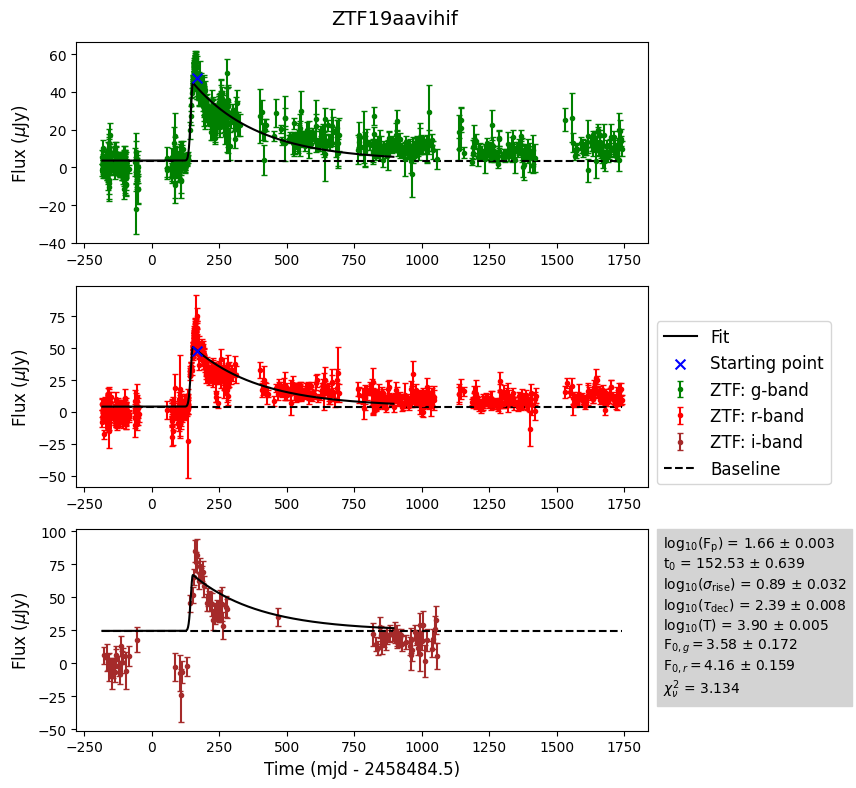

Green: 69 165.4435879997909 38.35985696774228
Red: 72 180.40576389990747 28.23966390290407
Combined 69 162.46807869989425 38.35985696774228
chi2val=1400.6078718262181 and dof=1045
Found chi2/dof = 1.340295


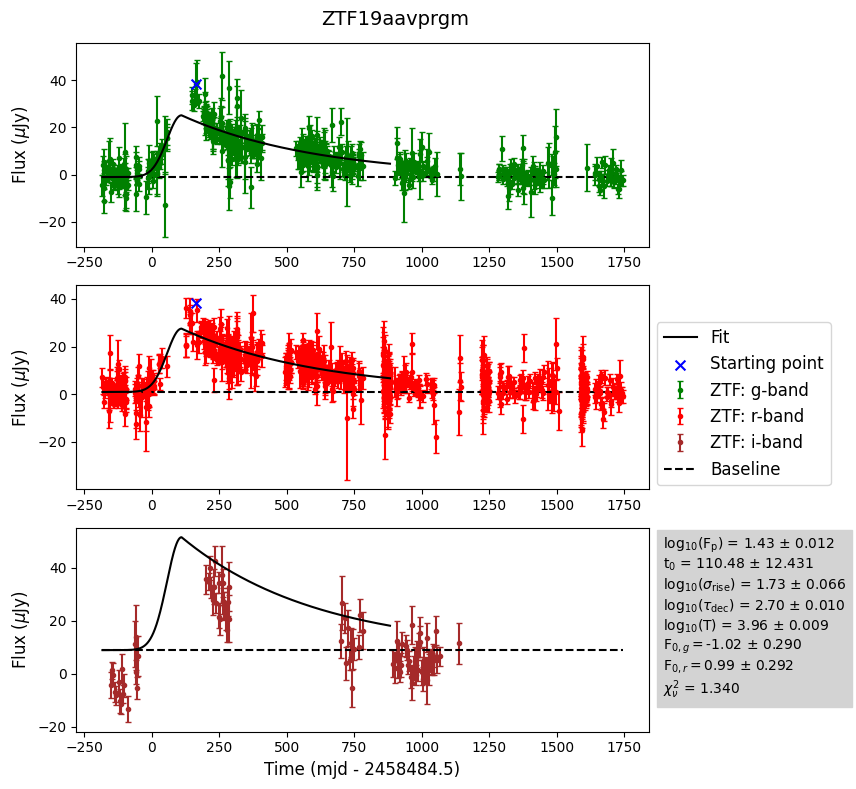

Green: 79 229.4192592999898 165.54435586130904
Red: 82 238.4394328999333 120.81432331945912
Combined 83 232.46478010015562 117.73750877957575
chi2val=3514.4548843124676 and dof=314
Found chi2/dof = 11.192531


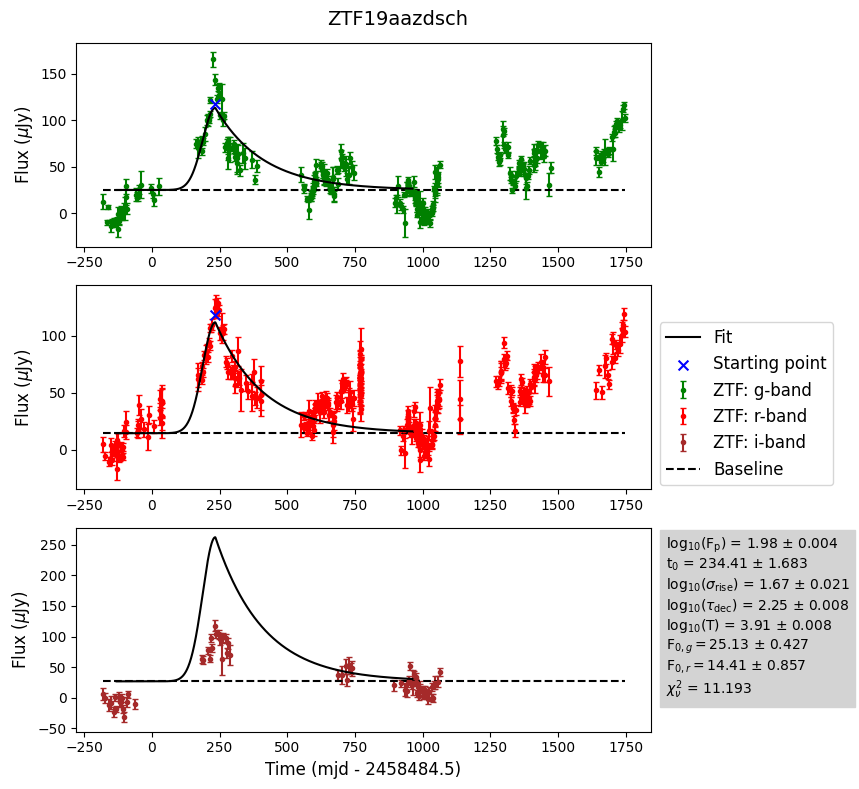

Green: 264 1140.4618056002073 72.33194755412457
Red: 263 1135.4062847001478 74.38722805036446
Combined 262 1127.4675463000312 72.16664122545241
chi2val=1827.6036368857513 and dof=419
Found chi2/dof = 4.361823


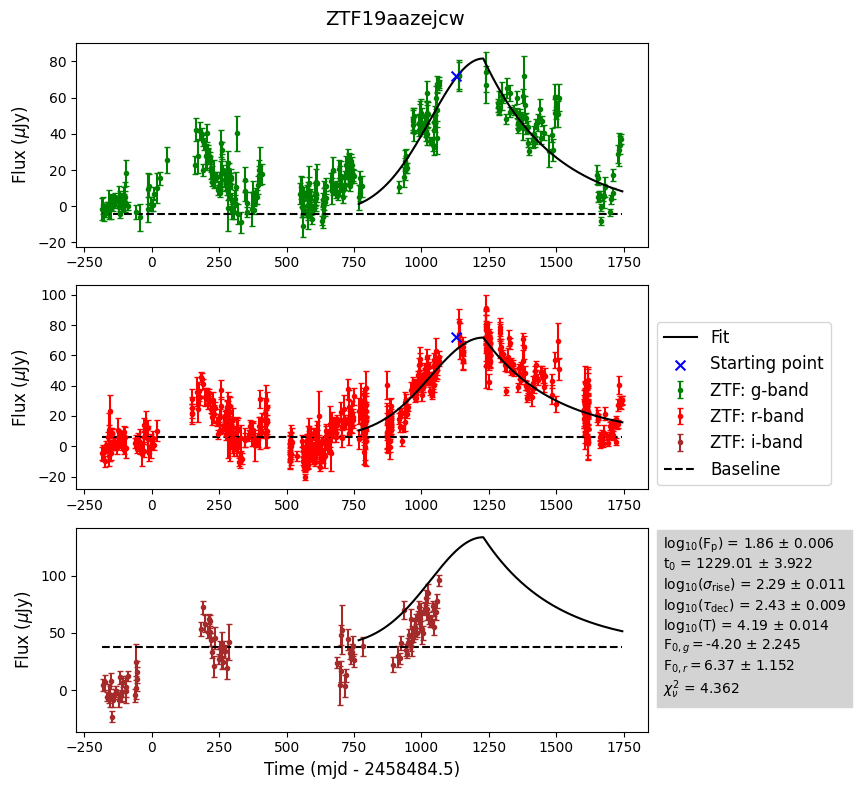

Green: 81 223.45450229989365 248.77018233505612
Red: 82 228.3690625000745 408.74006450166524
Combined 82 227.45150459976867 408.74006450166524
chi2val=44480.29550526611 and dof=1255
Found chi2/dof = 35.442467


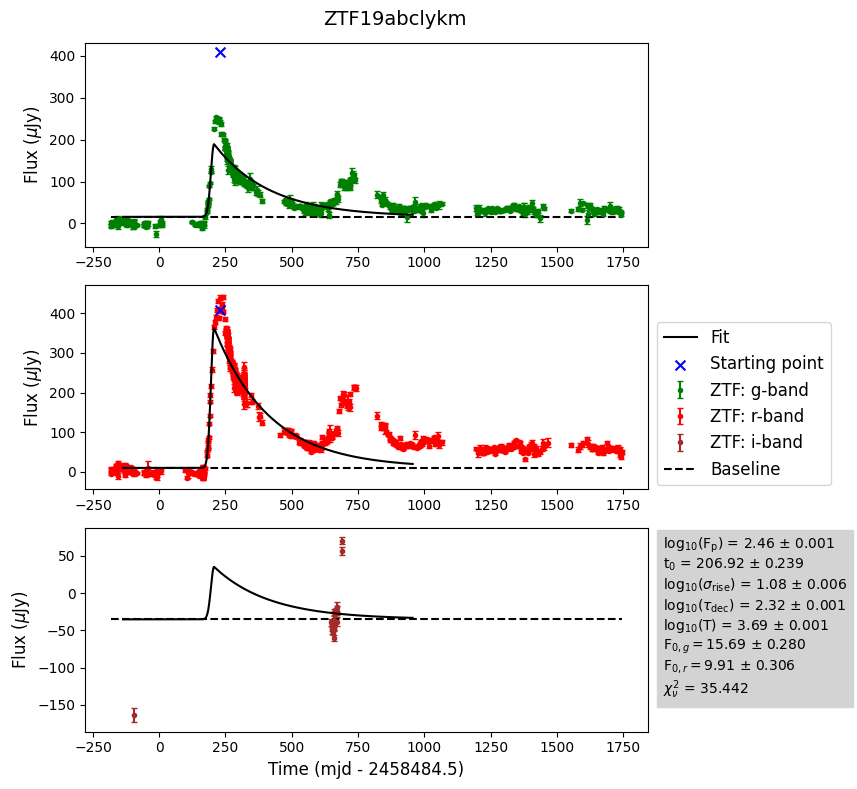

Green: 85 245.19325229991227 87.56234515512382
Red: 102 330.17685189982876 107.49395919574097
Combined 102 327.2554051000625 96.99289908173111
chi2val=843.5126019882393 and dof=632
Found chi2/dof = 1.334672


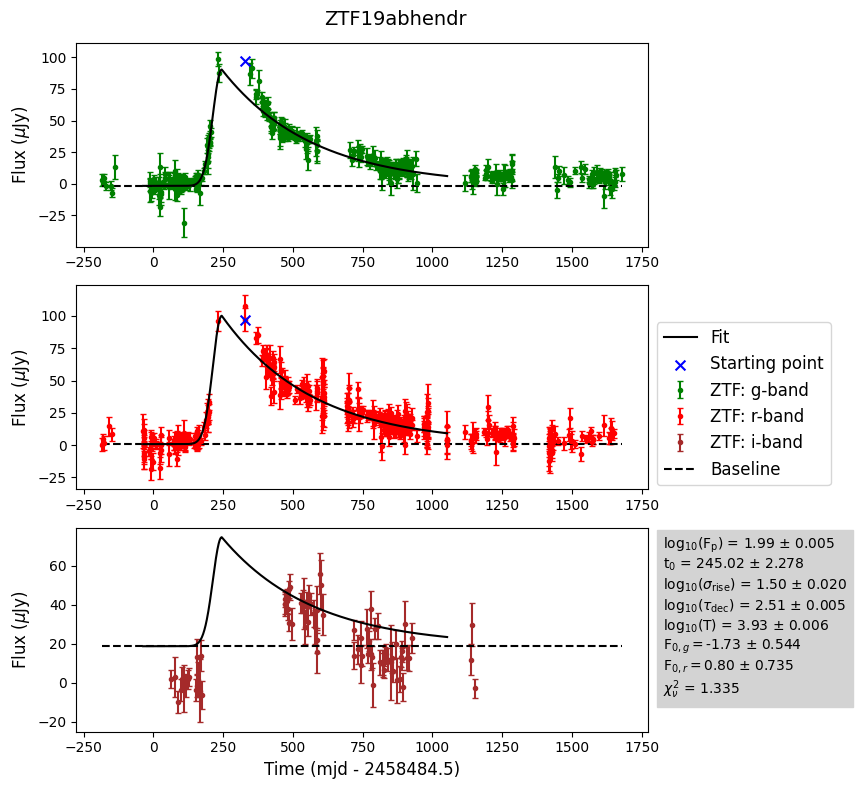

Green: 80 229.48795140022412 24.39865891801849
Red: 81 231.44107640022412 69.25864964707539
Combined 80 226.44107640022412 67.7407406266262
chi2val=814.0632829664659 and dof=558
Found chi2/dof = 1.458895


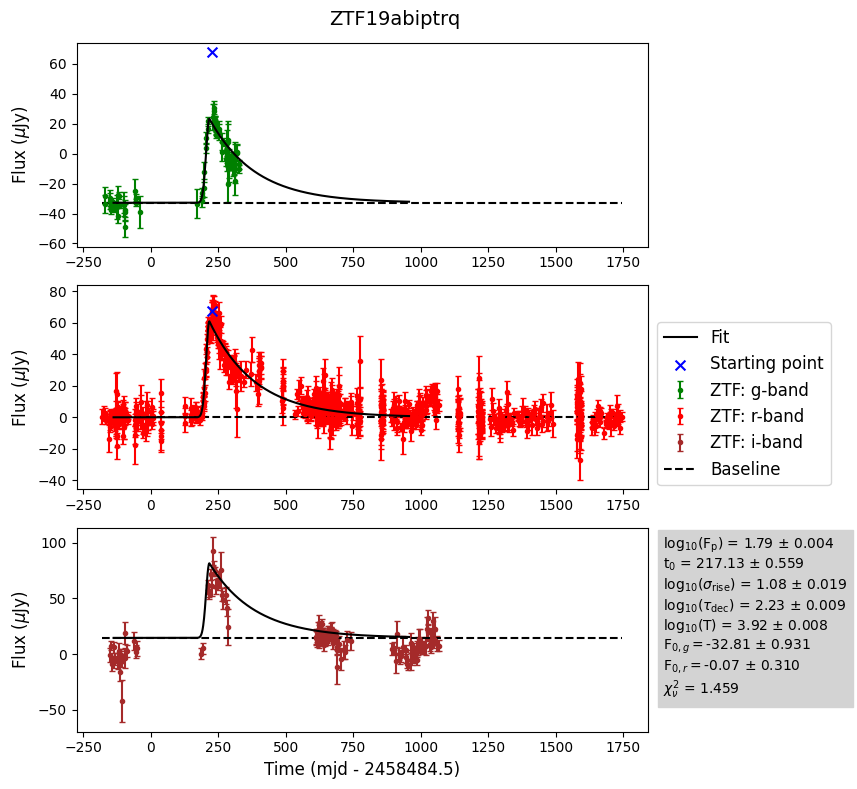

Green: 91 308.4302546000108 83.703124525462
Red: 92 311.4303355999291 69.55697671050933
Combined 92 311.4303355999291 77.19970746859804
chi2val=28.152608068630368 and dof=74
Found chi2/dof = 0.380441


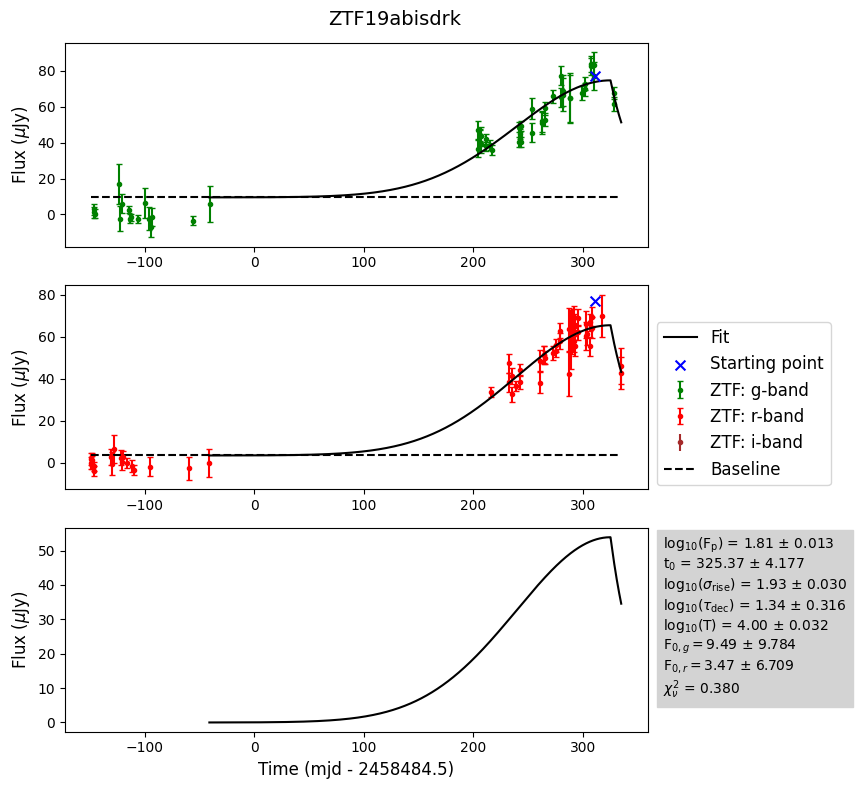

Green: 306 1360.37789350003 183.74589070049328
Red: 307 1365.4187500001863 201.05404011473692
Combined 309 1364.4183681001887 201.05404011473692
chi2val=1015.7465773291522 and dof=168
Found chi2/dof = 6.046111


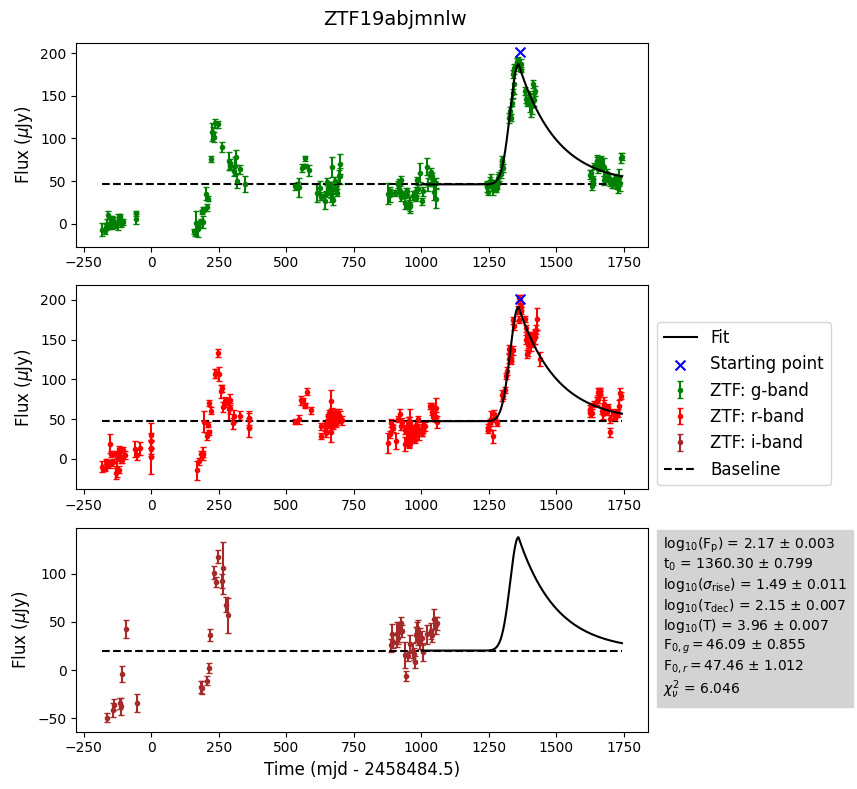

Green: 85 245.47153940005228 43.84412069193811
Red: 84 248.4506597002037 82.93880305774537
Combined 88 257.473888900131 66.87184445478074
chi2val=140.45438652195574 and dof=651
Found chi2/dof = 0.215752


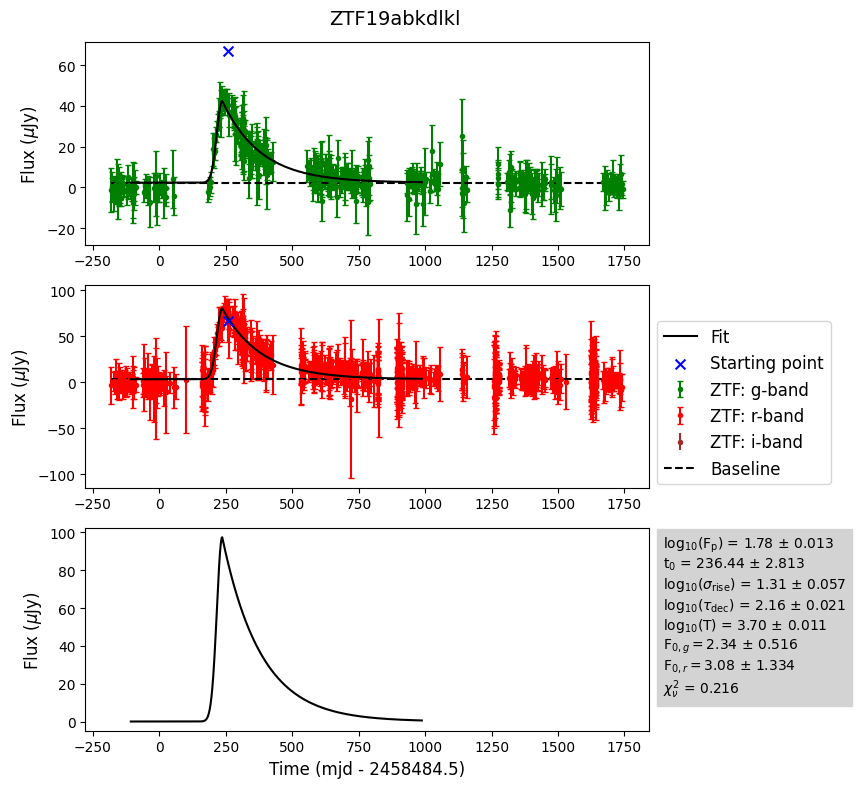

Green: 86 270.4156365999952 20.781714969481857
Red: 84 262.3729514000006 35.58602450824659
Combined 86 270.4156365999952 21.37229989244973
chi2val=109.49363498941369 and dof=98
Found chi2/dof = 1.117282


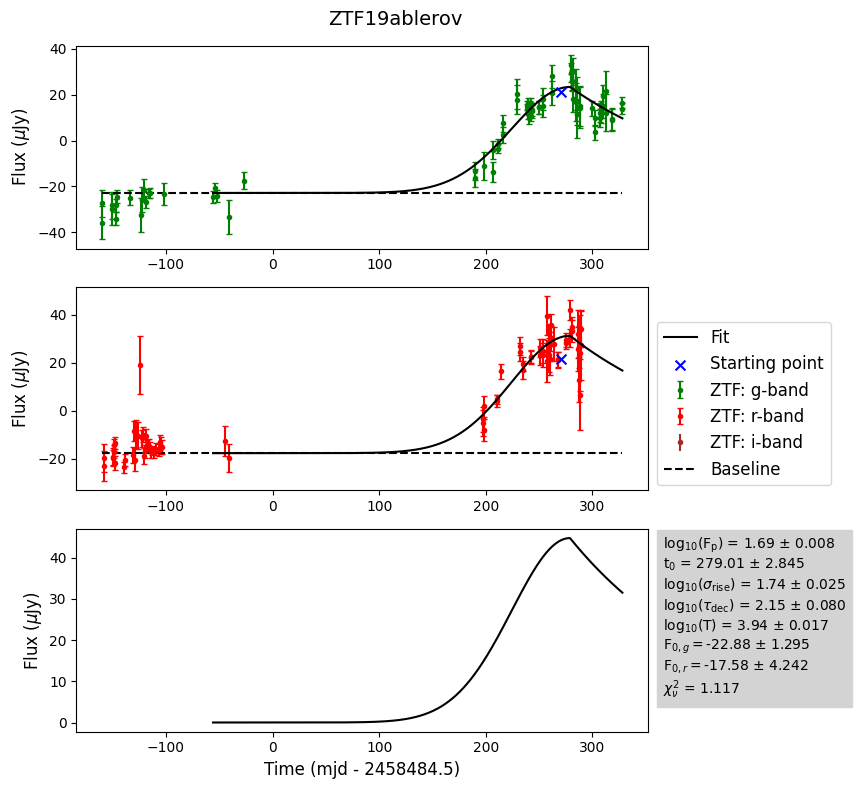

Green: 83 265.48167819995433 405.8953344419794
Red: 82 268.4990856000222 414.99808769244805
Combined 84 270.48167819995433 364.6326264628203
chi2val=4810.888215293466 and dof=420
Found chi2/dof = 11.454496


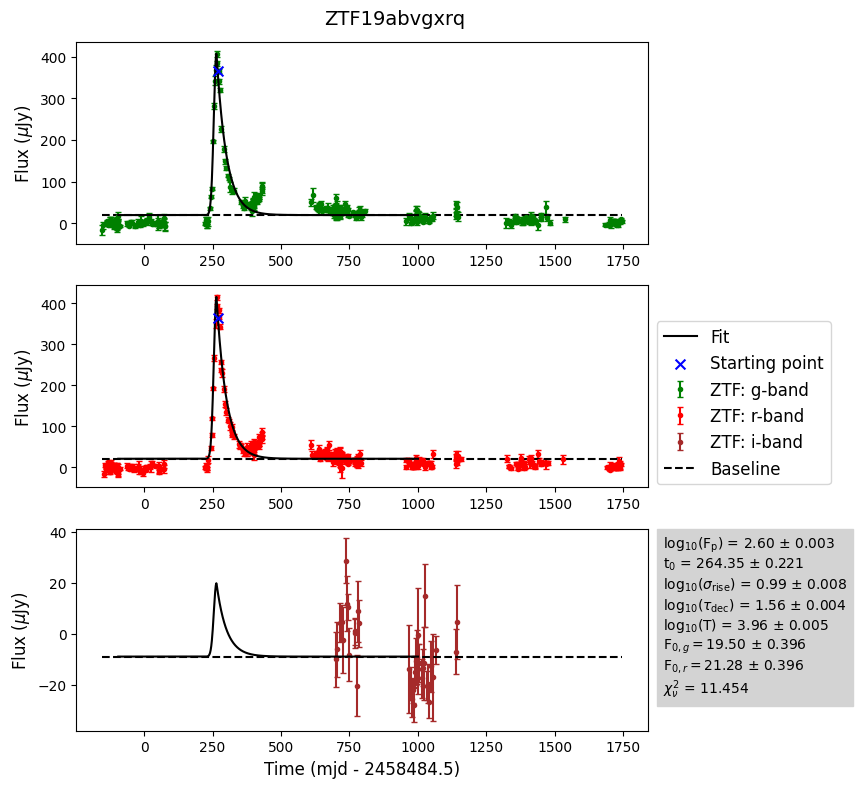

Green: 79 286.4689814997837 67.3321966236861
Red: 80 291.5147338001989 78.22207123082173
Combined 80 288.5160647998564 78.22207123082173
chi2val=2135.5497063258354 and dof=1131
Found chi2/dof = 1.888196


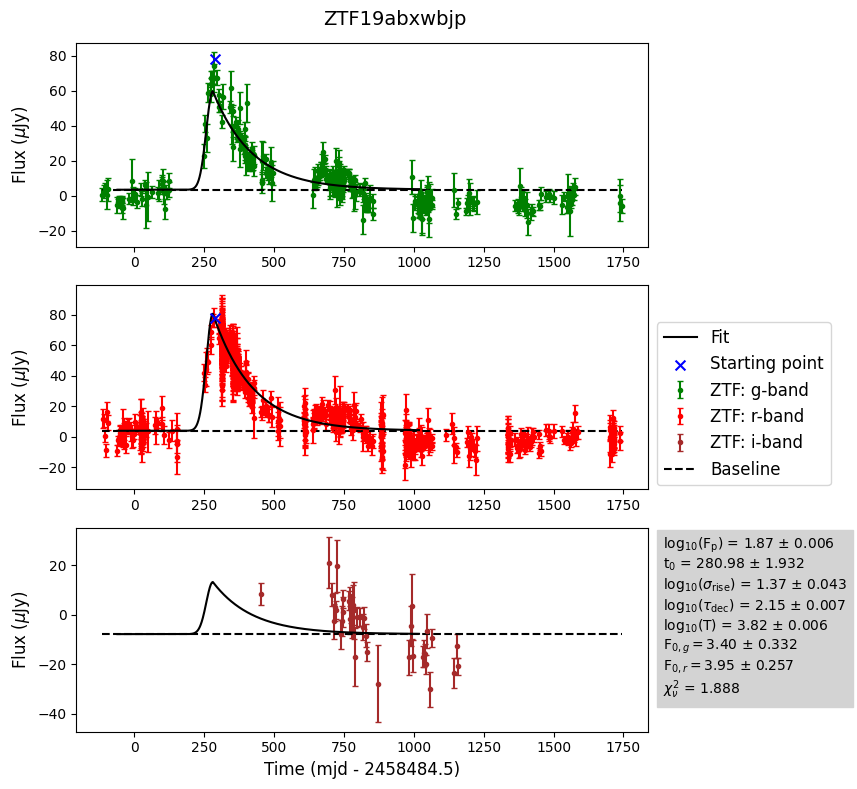

Green: 84 286.4631249997765 1721.5199777050955
Red: 84 286.5079051000066 1628.3623973409183
Combined 84 286.4631249997765 1628.3623973409183
chi2val=3880.061381845683 and dof=519
Found chi2/dof = 7.476033


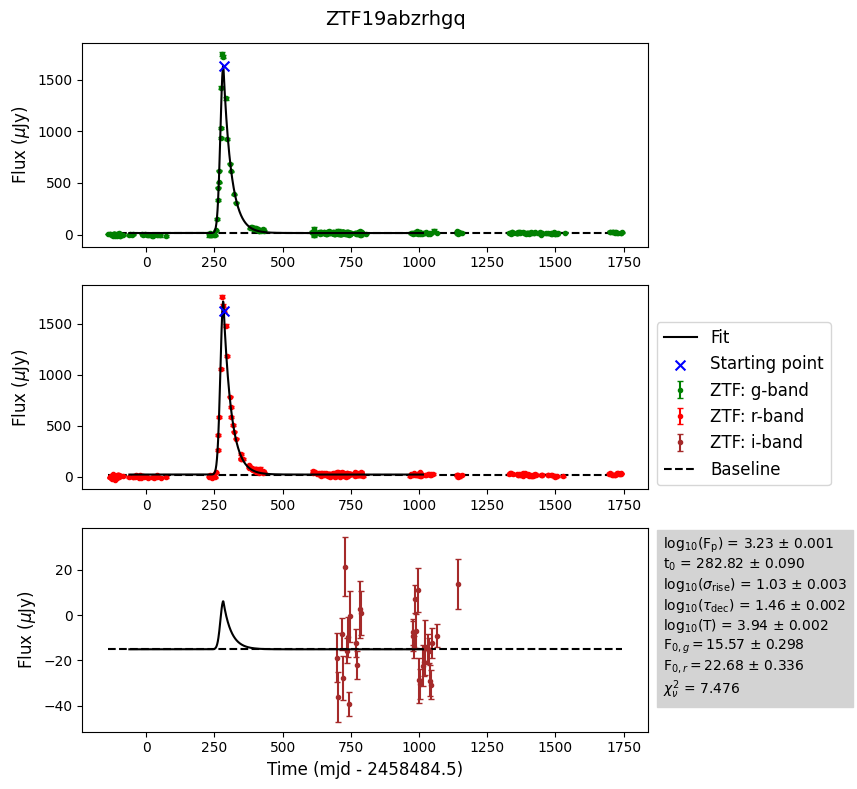

Green: 293 1282.2867708001286 49.38346241137948
Red: 293 1282.3719212999567 45.19620237155828
Combined 293 1282.2867708001286 49.38346241137948
chi2val=1335.5461797160447 and dof=407
Found chi2/dof = 3.281440


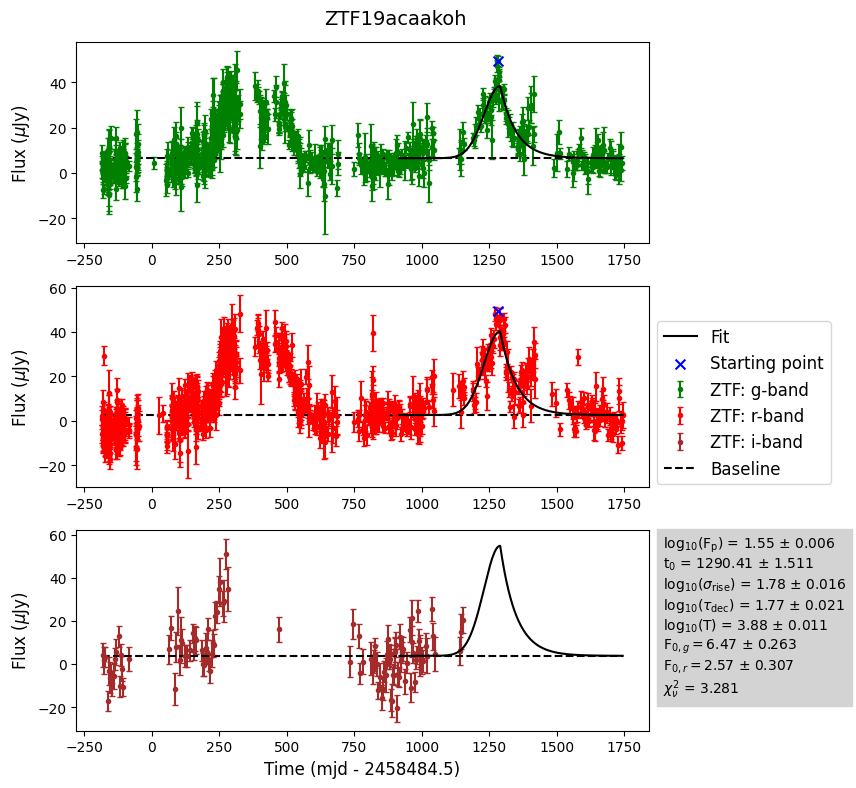

Green: 92 322.48700230009854 59.15458871369142
Red: 91 314.5043286997825 44.163542294154084
Combined 93 321.5036226999946 59.15458871369142
chi2val=1382.67808140527 and dof=436
Found chi2/dof = 3.171280


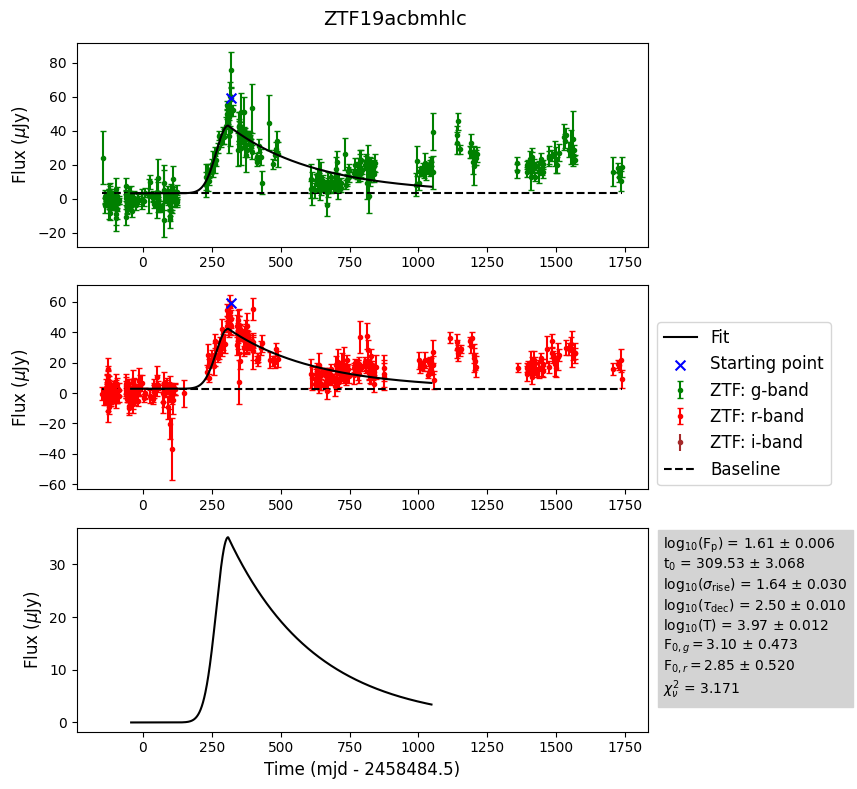

Green: 109 366.47719909995794 69.44236064821229
Red: 116 406.4357406999916 127.4047765470666
Combined 118 409.38122690003365 127.4047765470666
chi2val=2575.5171885171267 and dof=1167
Found chi2/dof = 2.206956


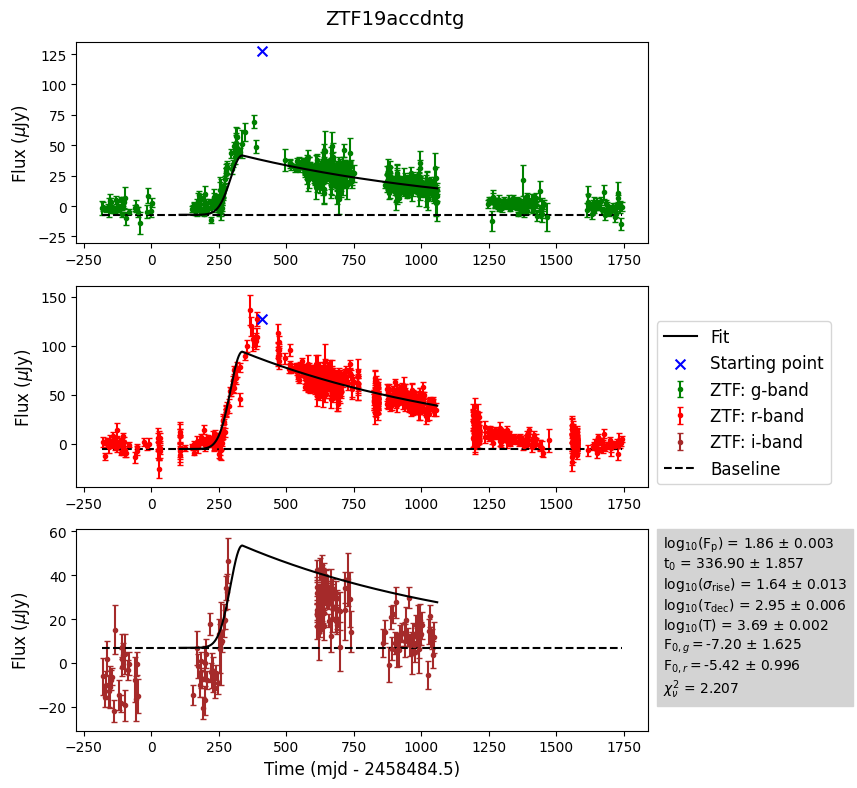

Green: 292 1399.4638078999706 60.39274457781977
Red: 288 1379.5303124999627 57.52345834084511
Combined 94 408.5410532001406 53.6229121953721
chi2val=1034.6313710989234 and dof=748
Found chi2/dof = 1.383197


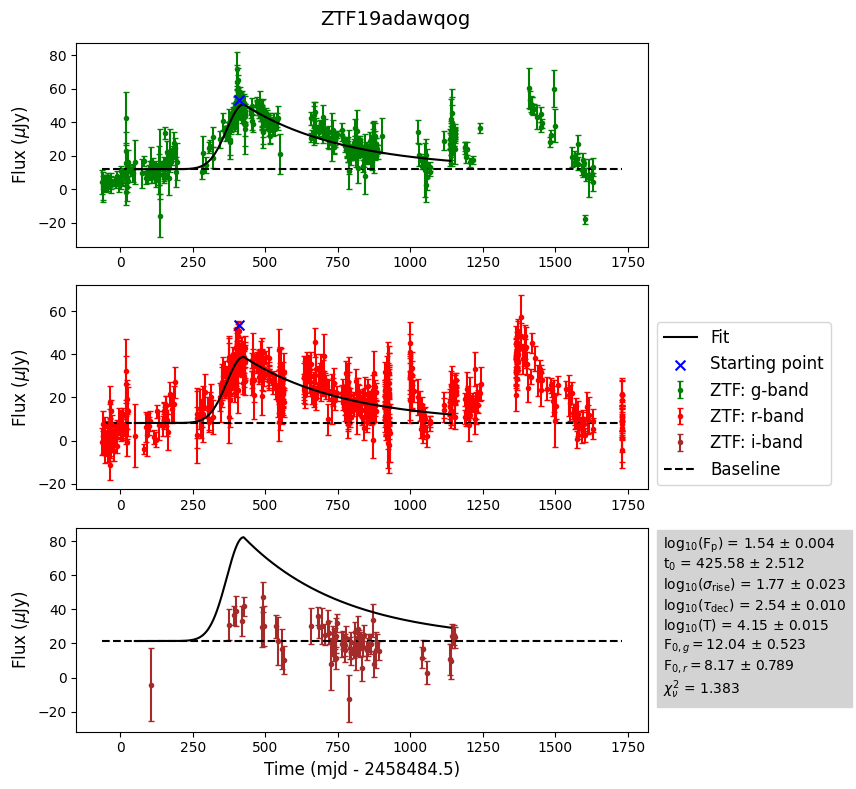

Green: 111 448.5075810002163 204.58665969058617
Red: 115 474.5290740998462 209.70059034169455
Combined 116 470.52246529981494 203.4168198540434
chi2val=2605.3158671052943 and dof=792
Found chi2/dof = 3.289540


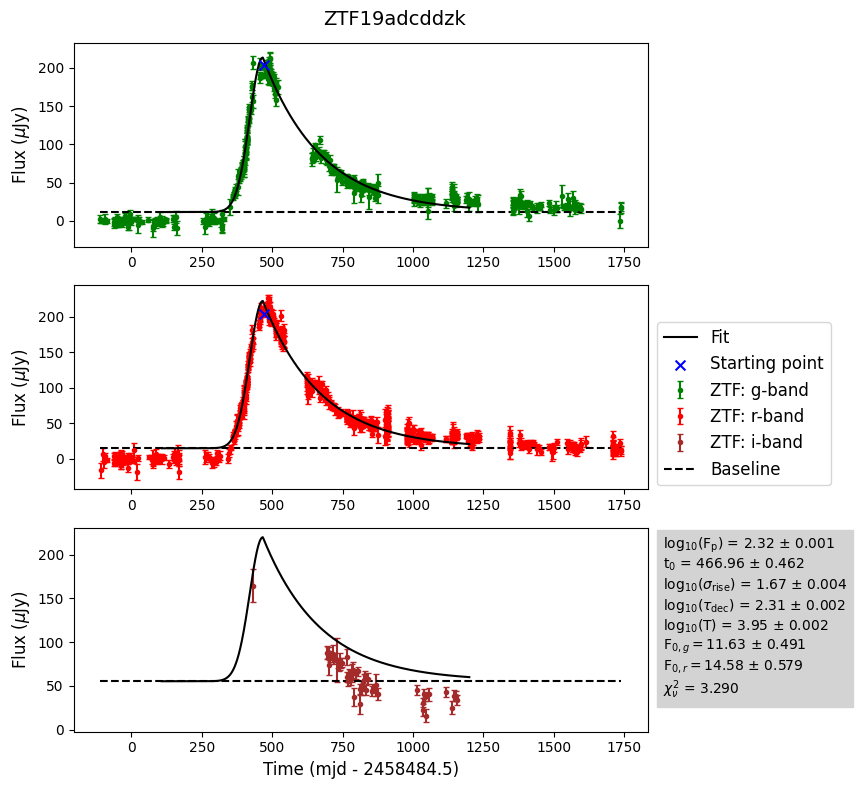

Green: 108 389.4641666999087 110.05583647021824
Red: 108 389.50145829981193 150.22593012665357
Combined 111 401.48302080016583 136.47074272096674
chi2val=1384.61888509253 and dof=613
Found chi2/dof = 2.258758


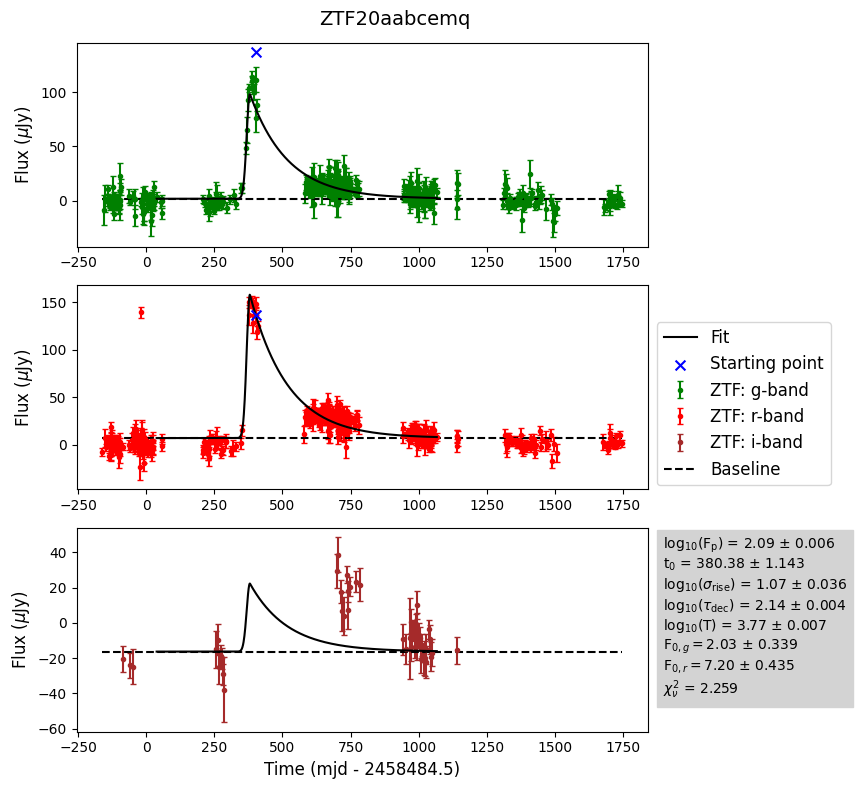

Green: 98 382.49707179982215 43.184492694568064
Red: 98 382.5195833002217 82.62314886028851
Combined 99 384.50526619981974 82.62314886028851
chi2val=2005.2406443446105 and dof=827
Found chi2/dof = 2.424717


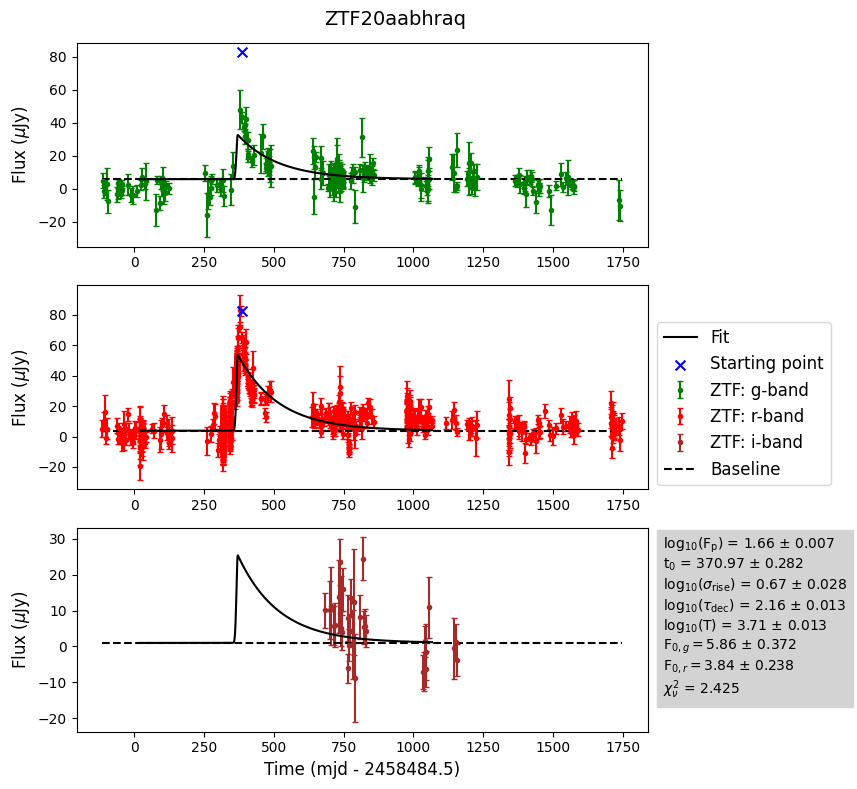

Green: 114 432.48700230009854 94.14061510756176
Red: 113 424.5043286997825 99.13088658880733
Combined 112 416.5036226999946 102.4372423513917
chi2val=461.47167987883086 and dof=426
Found chi2/dof = 1.083267


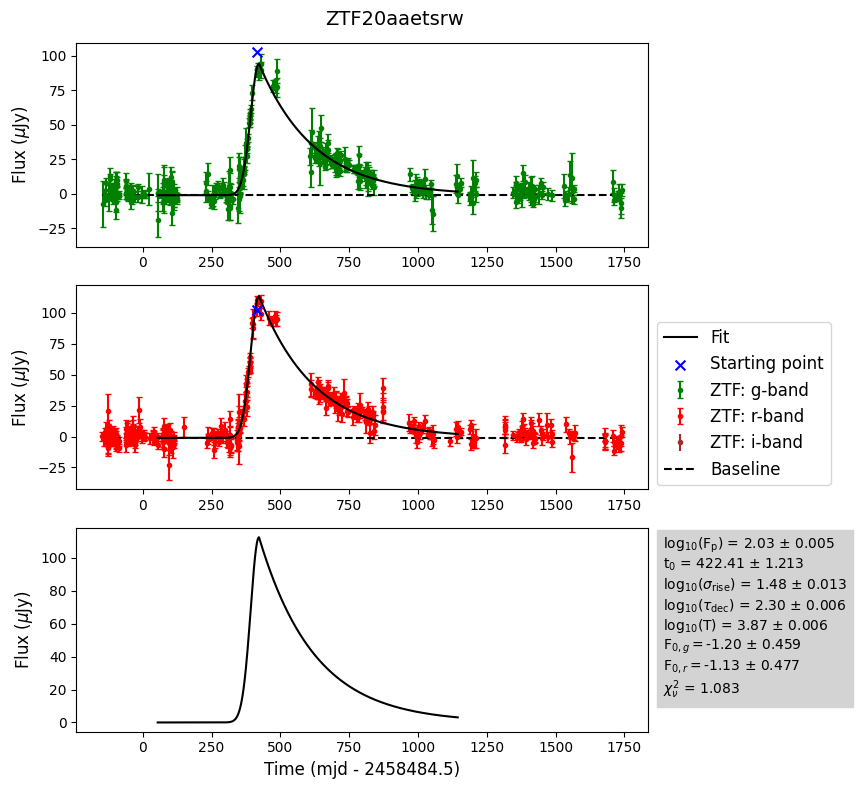

Green: 125 487.4879629998468 13.673536189091578
Red: 126 489.5038426001556 36.074623353304304
Combined 125 481.5041088000871 37.73579335166974
chi2val=1097.041982994676 and dof=733
Found chi2/dof = 1.496647


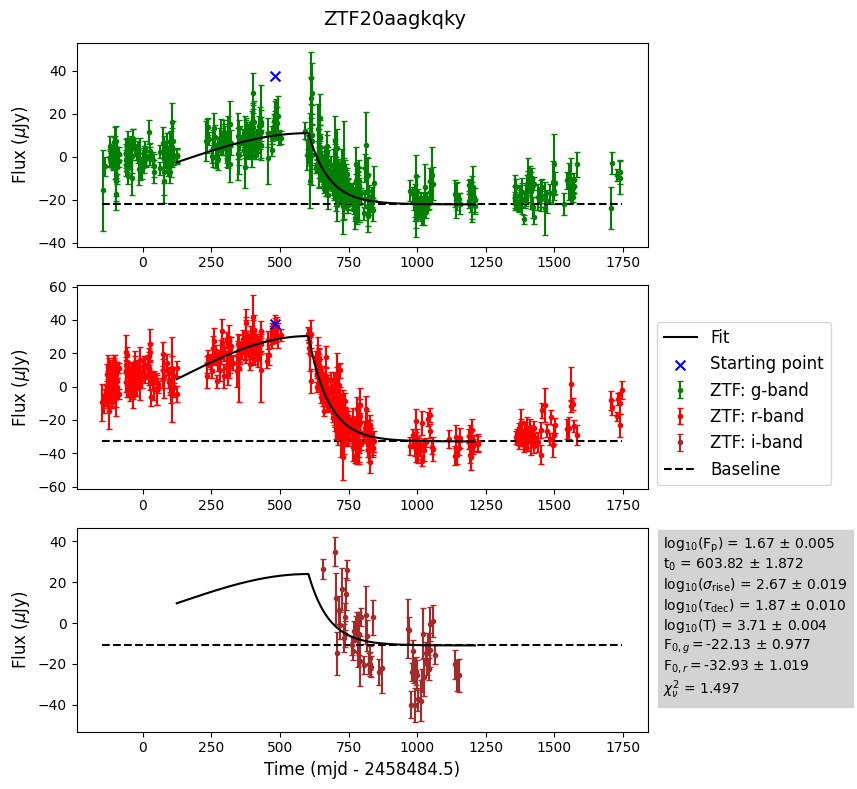

In [13]:
# rand_inst = ['ZTF18aauosxv']
np.random.seed(42)
rand_inst = os.listdir(sjoertpath)
# np.random.shuffle(rand_inst)
for i,ztf_name in enumerate(rand_inst):
    # if i == 0:
    #     continue
    # if i > 10:
    #     break
    if 'ZTF' in ztf_name:
        # print(ztf_name)
        ztf = ZTF_forced_phot(os.path.join(sjoertpath,ztf_name))
        # ztf.plot_clean_unclean_data()
        # try:
        ztf.fit()
        # except:
            # print(f"Error occured in fitting {ztf_name}.")
            # continue

## Special cases: 
1) Second outburst within the given burst frame causes rise and decay to mess up
2) Peak finder finds wrong peak (due to naiveness of finding protocol?) and curve_fit cannot converge to better peak
3) ??? 

Green: 29 51.49832180002704 335.0448172527906
Red: 33 59.52307870006189 416.01462072370805
Combined 144 614.5230787000619 376.5411064635409
chi2=15284.106191681942 and dof=802
Found chi2/dof = 19.057489


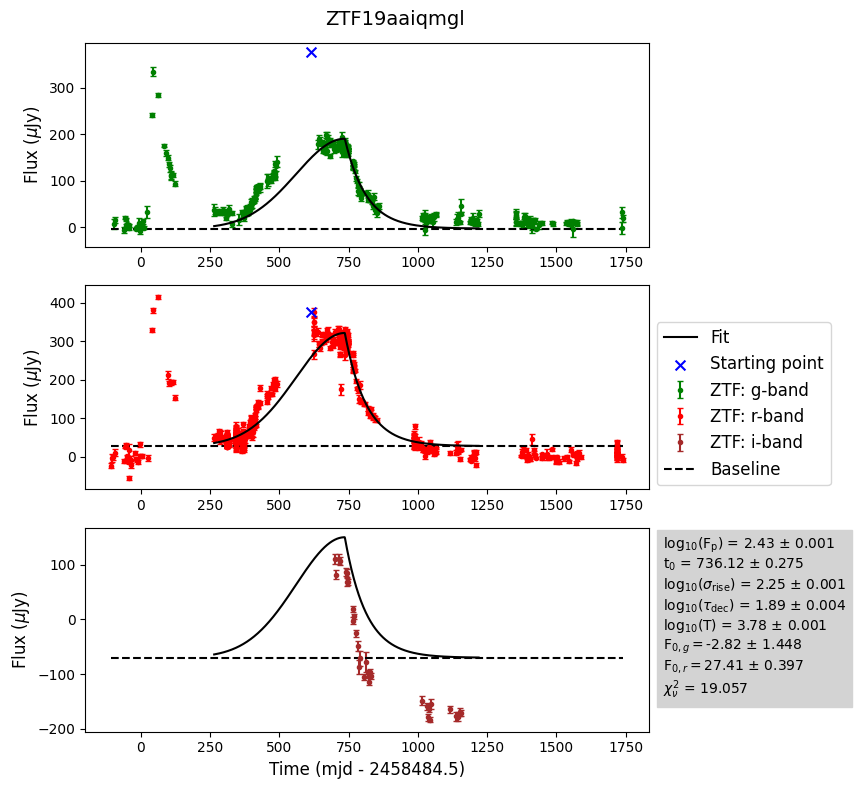

Green: 306 1360.37789350003 183.74589070049328
Red: 307 1365.4187500001863 201.05404011473692
Combined 309 1364.4183681001887 201.05404011473692
chi2=1015.7465773291522 and dof=168
Found chi2/dof = 6.046111


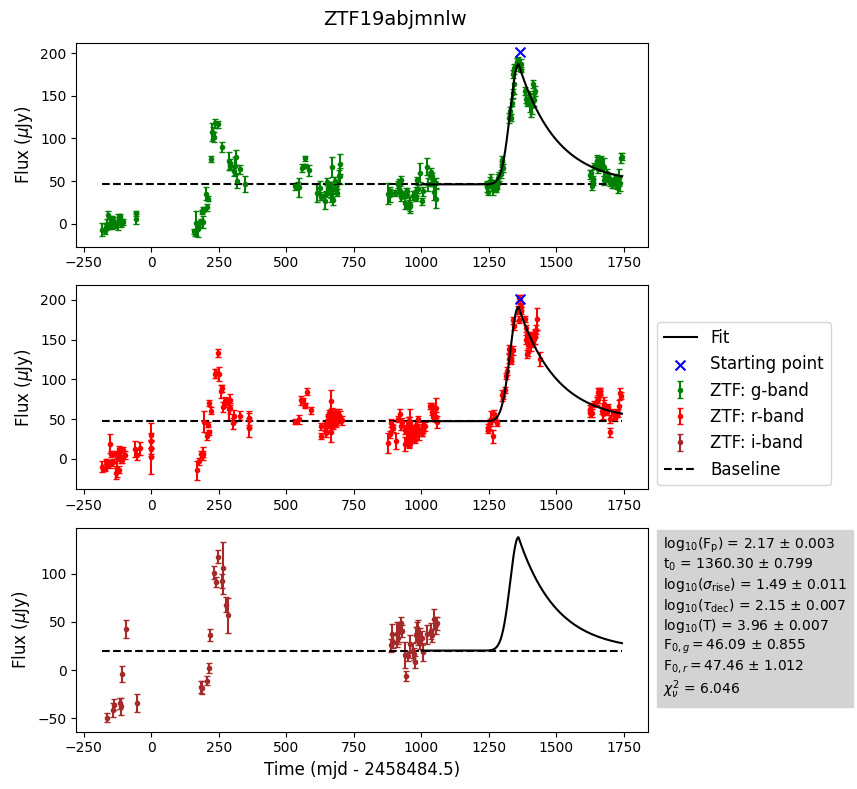

Green: 109 366.47719909995794 69.44236064821229
Red: 116 406.4357406999916 127.4047765470666
Combined 118 409.38122690003365 127.4047765470666
chi2=2575.5171885171267 and dof=1167
Found chi2/dof = 2.206956


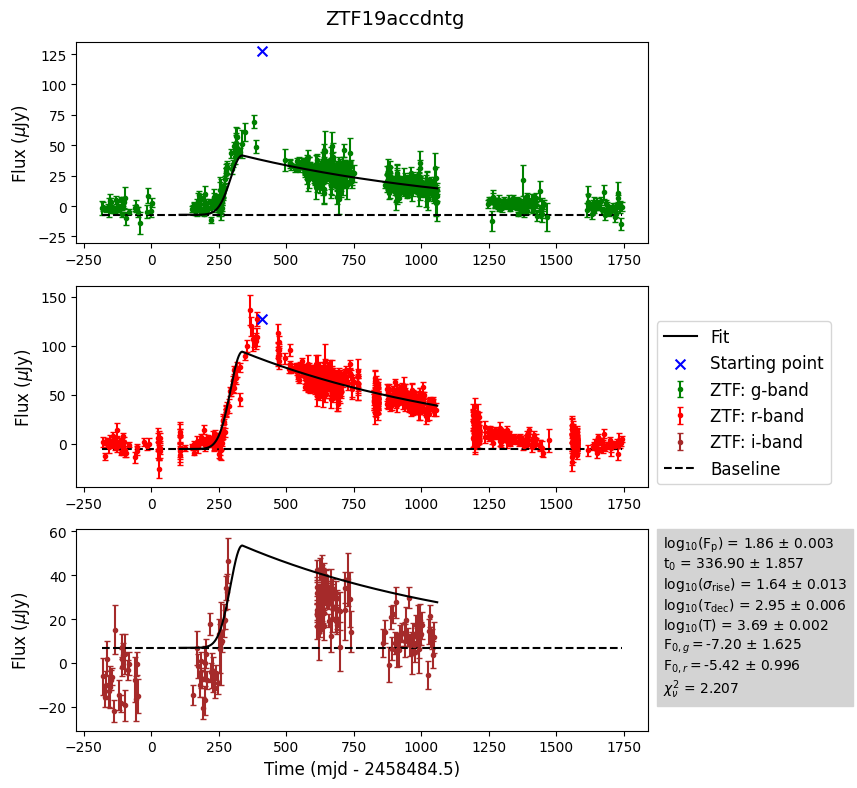

In [ ]:
weird_ztfs = ['ZTF19aaiqmgl', 'ZTF19abjmnlw', 'ZTF19accdntg']
# weird_ztfs = ['ZTF19abjmnlw']
for ztf_name in weird_ztfs:
    ztf_path = os.path.join(sjoertpath,ztf_name)
    ztf_obj = ZTF_forced_phot(ztf_path)
    ztf_obj.fit()
    # print(np.arange(np.min(ztf_obj.time[1:]),2459783.499988 - 2458484.5,step=5).shape)
    # print(2459783.499988 - 2458484.5)
    # plt.plot(np.arange(np.min(ztf_obj.time[1:]),2460157.49999 - 2458484.5,step=5),ztf_obj.chi2_results)


Green: 86 270.4156365999952 20.781714969481857
Red: 84 262.3729514000006 35.58602450824659
Combined 86 270.4156365999952 21.37229989244973


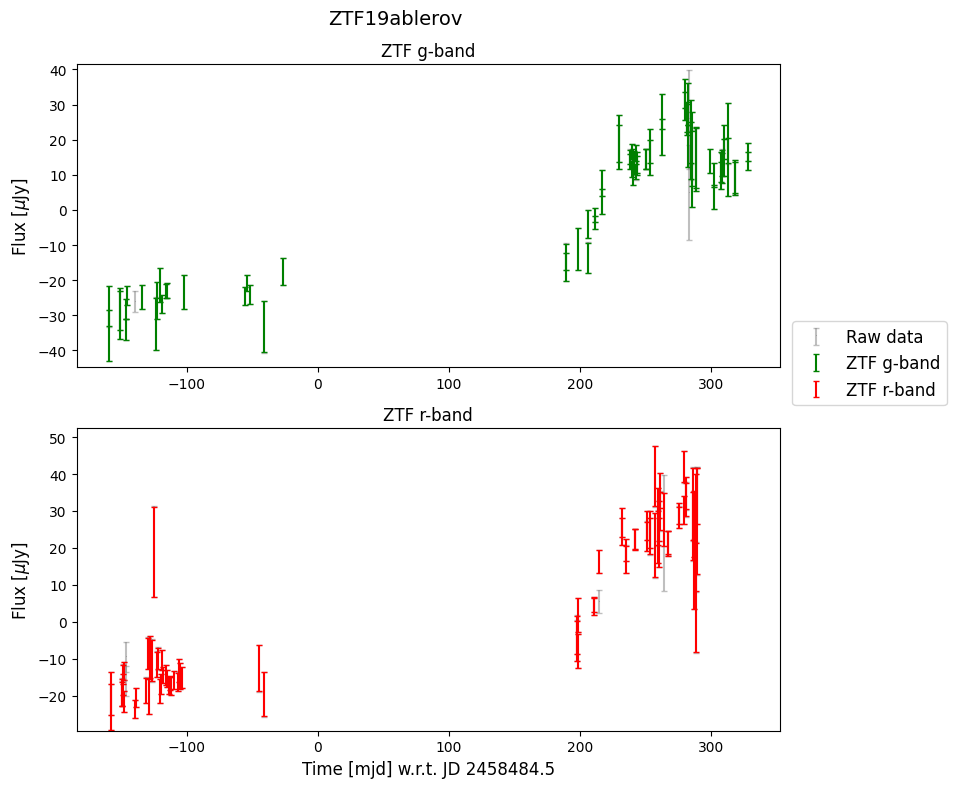

In [ ]:
weird_ztfs = ['ZTF19ablerov']
for ztf_name in weird_ztfs:
    ztf_path = os.path.join(sjoertpath,ztf_name)
    ztf_obj = ZTF_forced_phot(ztf_path)
    # ztf_obj.fit()
    ztf_obj.plot_clean_unclean_data()
    # print(np.arange(np.min(ztf_obj.time[1:]),2459783.499988 - 2458484.5,step=5).shape)
    # print(2459783.499988 - 2458484.5)
    # plt.plot(np.arange(np.min(ztf_obj.time[1:]),2460157.49999 - 2458484.5,step=5),ztf_obj.chi2_results)
